# <a href="https://mipt-stats.gitlab.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. `Pandas` и `Seaborn`

При возникновении сложностей, связанных с Питоном и библиотеками, посмотрите материалы видео-курса <a href="https://mipt-stats.gitlab.io/courses/python.html">Python для анализа данных</a>. Если не помогло, задайте вопрос по заданию.

**Правила:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ad21_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Работы, присланные иным способом, не принимаются.
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно ноутбук в формате ipynb. 
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*


**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 4 балла
* Задача 2 &mdash; 2 балла

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 5 баллов
* Задача 4 &mdash; 3 балла
* Задача 5 &mdash; 8 баллов

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1

Представьте, что вы министр образования страны котиков. Вам нужно решить какие школы лучше: маленькие или большие. Вы решили, что нужно сравнить их по результатам единого кошачьего экзамена (ЕКЭ). Предлагается посмотреть на средний результат по школам: отсортировать по нему и сделать выводы исходя из топ 10 лучших школ.

Вам дан датасет `cat_exam_data.csv` со следующими полями:
* `school` &mdash; номер школы;
* `test_score` &mdash; результат одного ученика из этой школы;
* `number_of_students` &mdash; кол-во учеников в школе.

Приведены данные по всем ученикам из 500 школ страны котиков.

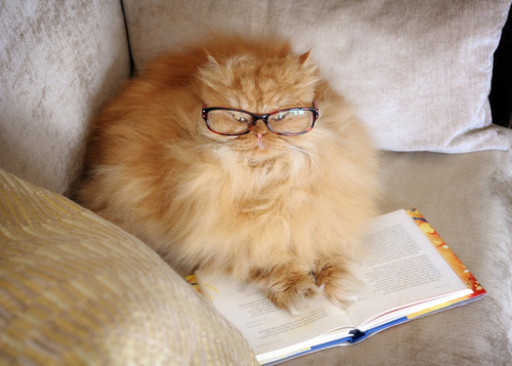

Загрузите датасет с результатами экзамена и посмотрите на первые пять строк.

*Подсказка.* Это можно сделать с помощью методов  <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html">read_csv</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.head.html">head</a>.

In [2]:
df = pd.DataFrame(pd.read_csv('cat_exam_data.csv', delimiter=','))
df.head(5)

,school,test_score,number_of_students
0,26,39.0,965
1,54,64.0,1483
2,356,64.0,1055
3,108,68.0,1806
4,298,78.0,971


Проверьте, что в данных нет пропусков (`NaN`). Если они есть:
* проверьте в каком столбце;
* удалите их.

*Подсказка.* Могут помочь методы <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.isna.html">isna</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html">dropna</a>.

In [3]:
#смотрим, что количество столбцов, где есть Nan не 0
table_with_nans_info = df.isna()
if len(np.where(pd.isna(df))[1]) != 0 :
#смотрим в каих именно столбцах
    print("Number of column")
    for column in range(table_with_nans_info.shape[1]):
        if table_with_nans_info.iloc[:,column].sum() != 0:
            print(column)

Number of column
1


Посчитайте описательные статистики (среднее, мин, макс, и тд.) по колонкам в таблице с помощью одной функции.

In [4]:
df.describe()

,school,test_score,number_of_students
count,501562.000000,501358.000000,501562.000000
mean,250.095661,51.681788,1088.868830
std,144.428841,14.179981,281.022934
min,0.000000,-0.000000,156.000000
25%,125.000000,42.000000,890.000000
50%,250.000000,52.000000,1079.000000
75%,377.000000,61.000000,1285.000000
max,499.000000,100.000000,1806.000000


Отдельного внимания заслуживает среднее. Какими способами его можно посчитать? Произведите вычисления и *подробно* проинтерпретируйте результаты. Что стоит публиковать в официальной статистике?

In [5]:
df.mode()

,school,test_score,number_of_students
0,108,52.0,1244


In [6]:
df.mean()

school                 250.095661
test_score              51.681788
number_of_students    1088.868830
dtype: float64

In [7]:
df.median() 

school                 250.0
test_score              52.0
number_of_students    1079.0
dtype: float64

Итак, мы посчитали 3 различных средних величины, которые чаще всего используются в статистике. 
Как видно, в нашем случае мода и среднее арифметическое  совпадают. Это означает, что все челичины находятся примерно в окрестности этих величин, потому что мода показывает величину, которая чаще всего встречается в данном эксперименте. А среднее арифметическое для дискретного случая - это математическое ожидание. В нашем случае медиана так же не сильно отличается от первых двух средних, что еще раз доказывает предположение о том, что все результаты находятся в близком диапазоне вокруг полученных средних значений (так как медиана показывает как бы середину ряду наших значений). Обычно в экономической практике, да и в жизни, используются мода и медиана, так как они лучше учитывают "большинство". 

Посчитайте сколько котиков получили 100 баллов.

In [8]:
has_100_points = df[df.test_score == 100]
len(has_100_points)

51

Выведите подробную информацию о школах, где есть хотя бы один котик, получивший 100 баллов на ЕКЭ.
Отсортируйте эти школы по количеству стобалльников.

*Подсказка.* Могут помочь методы <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html">groupby</a>, <a target="_blank" href="https://pandas.pydata.org/pandas-docs/version/0.23.4/generated/pandas.DataFrame.sort_values.html">sort_values</a>, <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.transform.html">transform</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.count.html">count</a>.

In [9]:
has_100_points.value_counts()

school  test_score  number_of_students
486     100.0       800                   2
4       100.0       1015                  1
395     100.0       436                   1
302     100.0       1517                  1
303     100.0       701                   1
315     100.0       580                   1
328     100.0       789                   1
342     100.0       920                   1
346     100.0       913                   1
351     100.0       1224                  1
357     100.0       1003                  1
359     100.0       895                   1
394     100.0       1079                  1
403     100.0       1317                  1
14      100.0       777                   1
412     100.0       1032                  1
414     100.0       1134                  1
425     100.0       929                   1
429     100.0       768                   1
436     100.0       878                   1
451     100.0       1077                  1
463     100.0       809              

Посчитайте средний результат каждой из школ и посмотрите на результат. Рассматриваем все школы, не только со стобальниками.

*Подсказка.* Может помочь метод <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.mean.html">mean</a>.

In [10]:
schools = df.groupby('school').mean()
print(schools)

        test_score  number_of_students
school                                
0        52.294258                 418
1        52.028950                1209
2        51.751451                1035
3        51.566265                1245
4        51.025641                1015
...            ...                 ...
495      50.933275                1139
496      51.146402                1209
497      51.141228                1140
498      51.709799                 796
499      52.413738                1253

[500 rows x 2 columns]


Отсортируйте школы по среднему результату.

In [11]:
results = schools.sort_values(by=["test_score"], ascending = False)
print(results)

        test_score  number_of_students
school                                
57       53.341682                 560
124      52.993311                 598
263      52.982063                 669
82       52.981982                 555
366      52.970207                 773
...            ...                 ...
194      50.406977                 774
471      50.362500                 960
486      50.325000                 800
211      50.248571                 351
353      50.050595                 336

[500 rows x 2 columns]


Посмотрите на топ 10 лучших результатов.

In [12]:
results.head(10)

,test_score,number_of_students
school,,
57,53.341682,560
124,52.993311,598
263,52.982063,669
82,52.981982,555
366,52.970207,773
465,52.957555,1179
169,52.932401,858
449,52.910364,357
477,52.898515,808


**Вывод:** Лучший средний результат наблюдается у школ с меньшим количеством учеников, но при этом точно утвержать о такой зависимости мы не можем. Так же видно, что лучший средний балл не сильно привосходит средний балл всех участников.

Ожидаем, что внизу рейтинга будут только большие школы, давайте это проверим. Посмотрите теперь на 10 худших школ.

In [13]:
results.tail(10)

,test_score,number_of_students
school,,
383,50.716981,636
264,50.702906,929
48,50.690293,649
156,50.641354,1093
394,50.461538,1079
194,50.406977,774
471,50.362500,960
486,50.325000,800
211,50.248571,351


**Вывод:** Внизу так же находятся школы с маленьким количеством учеников, поэтому мы точно знаем, что ни линейной, ни любой другой однозначной зависимости средних результатов от количества учеников нет.

Постройте график зависимости среднего результата ЕКЭ от количества учеников.

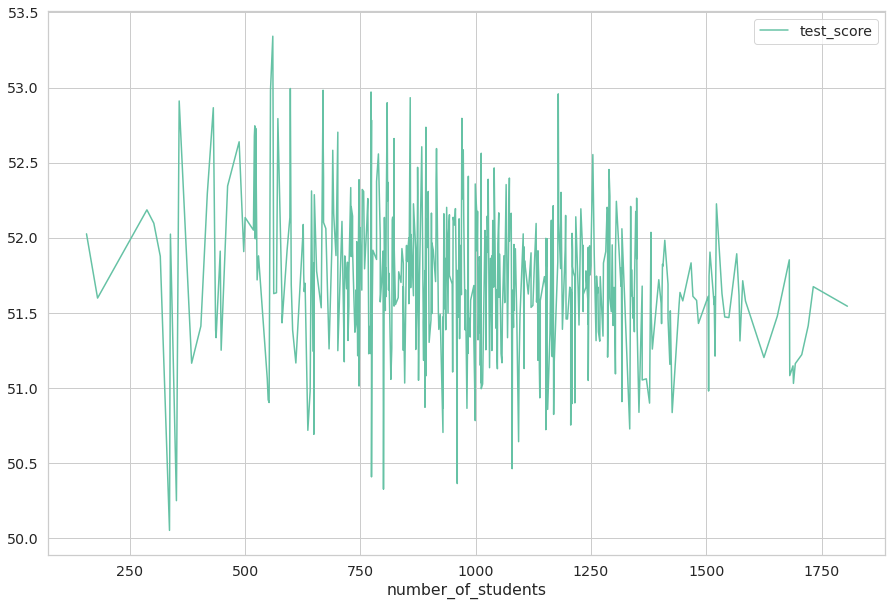

In [14]:
results = results.sort_values('number_of_students')
results.plot("number_of_students","test_score",figsize=(15, 10))
plt.show()

**Вывод:** По данному графику нельзя судить о зависисмости среднего балла от количества учеников в школе. 

Но как же тогда решить какие школы лучше? 

Сгруппируйте учеников в зависимости от типа школы, получив тем самым два датасета. Будем считать, что школа небольшая, если в ней не более 1000 учеников.

In [15]:
mask = df['number_of_students'] > 1000
big,small = df[mask], df[-mask]

Постройте гистограммы этих двух выборок на одном графике, установив параметры
* `bins=10` &mdash; число бинов гистограммы;
* `alpha=0.5` &mdash; прозрачность бинов.

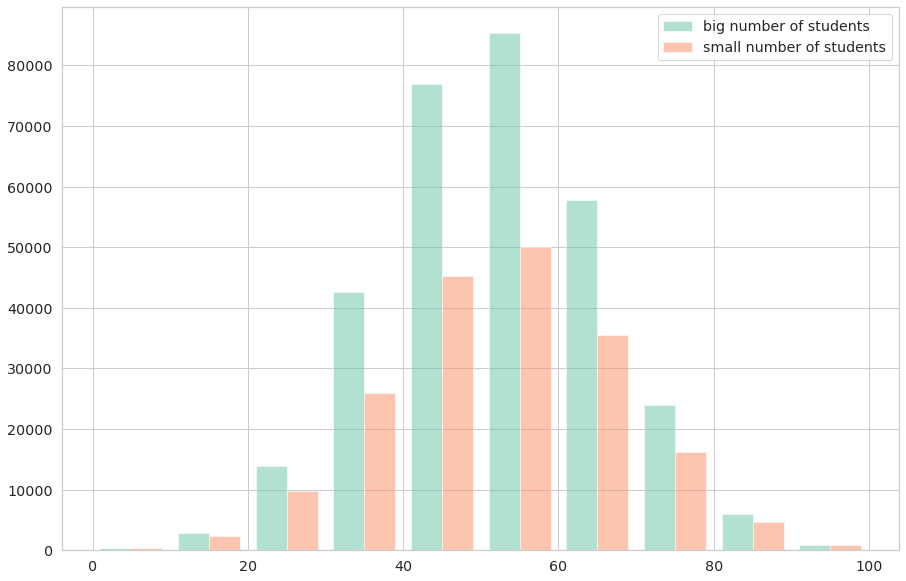

In [16]:
plt.figure(figsize=(15,10))
plt.hist([big['test_score'], small['test_score']], bins=10,alpha=0.5, label=['big number of students', 'small number of students'])
plt.legend(loc='upper right')
plt.show()

**Вывод:** Благодаря гистограмме мы теперь точно можем сказать, что результаты у школ с большим количеством учеников лучше (но это объясняется, как минимум, тем, что количество учеников больше, а значит, и данных больше). Но при этом учеников с самыми большими показателями у школ обоих показателей поровну.

---

### Задача 2

Задача заключается в работе с данными о трендах на <a target="_blank" href="https://www.youtube.com/">YouTube</a>. В этом вам поможет библиотека `seaborn`, которая была рассмотрена на одной из последних лекций.

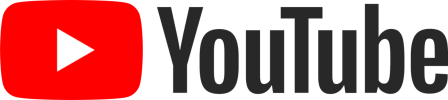


<b>1. Подготовка данных</b>

Скачайте файл `RUvideos_short.csv` с данными о видео в российском сегменте Youtube с 14 ноября по 21 ноября 2017 года. Полная версия данных доступна на <a target="_blank" href="https://www.kaggle.com/datasnaek/youtube-new#RUvideos.csv">kaggle</a>.

Прочитайте данные с помощью библиотеки `pandas` и напечатайте начало таблицы. В колонке `trending_date` записана дата. При чтении таблицы распознайте ее.

*Замечание. Часто считывание дат &mdash; головная боль аналитика.*

In [17]:
df_youtube = pd.DataFrame(pd.read_csv('RUvideos_short.csv', delimiter=',', parse_dates=['trending_date']))
df_youtube.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,gDuslQ9avLc,17.14.11,Захар и Полина учатся экономить,Т—Ж БОГАЧ,22,2017-11-13T09:09:31.000Z,"захар и полина|""учимся экономить""|""копить день...",62408,334,190,50,https://i.ytimg.com/vi/gDuslQ9avLc/default.jpg,False,False,False,"Знакомьтесь, это Захар и Полина. Вместе с ними..."
1,AOCJIFEA_jE,17.14.11,Биржа Мемов #29. Большой выпуск,Druzhko Show,22,2017-11-13T17:32:11.000Z,"биржа мемов|""лев шагинян""|""мемы""|""пикчи""|""друж...",330043,43841,2244,2977,https://i.ytimg.com/vi/AOCJIFEA_jE/default.jpg,False,False,False,"В 29 выпуске Дружко Шоу Сергей сказал, что Бир..."
2,VAWNQDgwwOM,17.14.11,ХАЙП КЭМП - СВОЙ СРЕДИ ЧУЖИХ,Юлик,24,2017-11-13T16:11:31.000Z,"юмор|""комедия""|""влог""|""блог""|""смешно""|""смешное...",424596,49854,714,2944,https://i.ytimg.com/vi/VAWNQDgwwOM/default.jpg,False,False,False,http://kapitany.ru/!Yulik.cap - Факультет #Кап...
3,gknkFwKQfHg,17.14.11,Сочная кесадилья с курицей,Hochland,22,2017-11-13T06:51:10.000Z,"хохланд|""сыр""|""рецепты""|""как приготовить""|""вку...",112851,3566,122,80,https://i.ytimg.com/vi/gknkFwKQfHg/default.jpg,False,False,False,*** как готовить ресторанные блюда дома
4,3sYvZcwzZr8,17.14.11,КЛИПЫ РОДИТЕЛЕЙ НА ШКОЛЬНЫЙ ВЫПУСКНОЙ,Совергон,24,2017-11-13T16:52:36.000Z,"Совергон|""Sovergon""|""клипы""|""родители""|""школа""...",243469,36216,631,1692,https://i.ytimg.com/vi/3sYvZcwzZr8/default.jpg,False,False,False,❏ КОНКУРС КАПИТАНЫ: http://kapitany.ru/!Soverg...


In [18]:
df_youtube.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                1600 non-null   object
 1   trending_date           1600 non-null   object
 2   title                   1600 non-null   object
 3   channel_title           1600 non-null   object
 4   category_id             1600 non-null   int64 
 5   publish_time            1600 non-null   object
 6   tags                    1600 non-null   object
 7   views                   1600 non-null   int64 
 8   likes                   1600 non-null   int64 
 9   dislikes                1600 non-null   int64 
 10  comment_count           1600 non-null   int64 
 11  thumbnail_link          1600 non-null   object
 12  comments_disabled       1600 non-null   bool  
 13  ratings_disabled        1600 non-null   bool  
 14  video_error_or_removed  1600 non-null   bool  
 15  desc

In [19]:
df_youtube['trending_date'] = pd.to_datetime(df_youtube['trending_date'],format='%y.%d.%m' , yearfirst=True)

In [20]:
df_youtube['trending_date']

0      2017-11-14
1      2017-11-14
2      2017-11-14
3      2017-11-14
4      2017-11-14
          ...    
1595   2017-11-21
1596   2017-11-21
1597   2017-11-21
1598   2017-11-21
1599   2017-11-21
Name: trending_date, Length: 1600, dtype: datetime64[ns]

В таблице много лишних данных. Оставьте следующие столбцы:
* `trending_date` &mdash; дата в формате год-день-месяц;
* `category_id` &mdash; категория видео, названия приведены в файле `RU_category_id.json`;
* `views` &mdash; количество просмотров видео;
* `likes` &mdash; количество лайков;
* `dislikes` &mdash; количество дислайков;
* `comment_count` &mdash; количество комментариев.

Из даты оставьте только день. Для этого можно пройтись циклом по всем датам и взять поле `day` у объекта даты. Напечатайте начало таблицы.

In [21]:
df_for_future = df_youtube[['trending_date','title','category_id','views','likes','dislikes','comment_count']]
df_youtube.drop(df_youtube.columns.difference(['trending_date','category_id','views','likes','dislikes','comment_count']), 1, inplace=True)
for i in range(len(df_youtube)):
    df_youtube.loc[i,'trending_date'] = df_youtube.loc[i,'trending_date'].day
df_youtube

,trending_date,category_id,views,likes,dislikes,comment_count
0,14,22,62408,334,190,50
1,14,22,330043,43841,2244,2977
2,14,24,424596,49854,714,2944
3,14,22,112851,3566,122,80
4,14,24,243469,36216,631,1692
...,...,...,...,...,...,...
1595,21,2,5498,373,19,49
1596,21,2,40394,1339,179,201
1597,21,25,3516,65,7,4
1598,21,25,47507,4372,231,2380


<b>2. Некоторая визуализация</b>

Постройте ящики с усами на каждый день по количеству просмотров. Насколько хороший получился график?

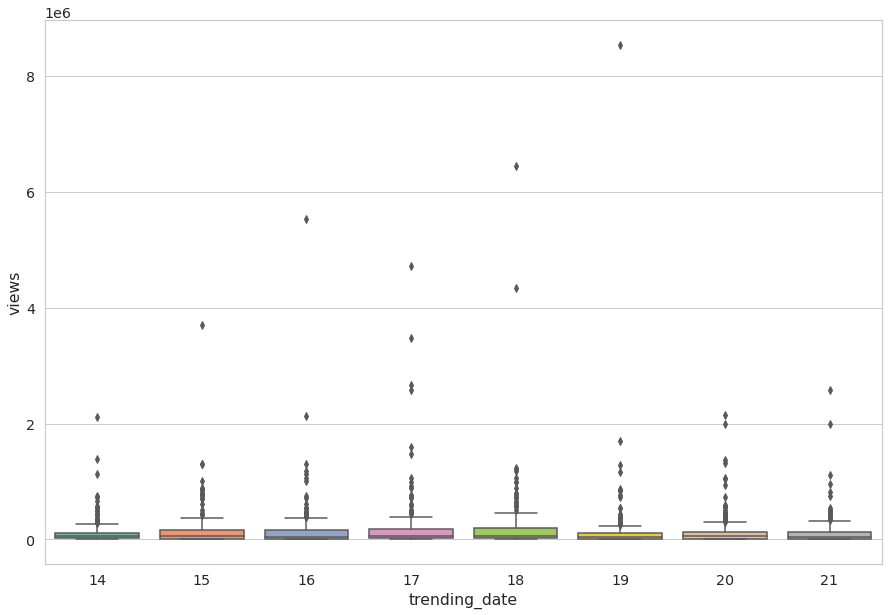

In [22]:
plt.figure(figsize=(15, 10))
sns.boxplot(x = 'trending_date', y = 'views', data = df_youtube)
plt.show()

Графики бывают, конечно, и хуже в жизни, но этот тоже нечитаемый и по нему сложно что либо сказать.

Исправьте этот недостаток, установив некоторое значение. 

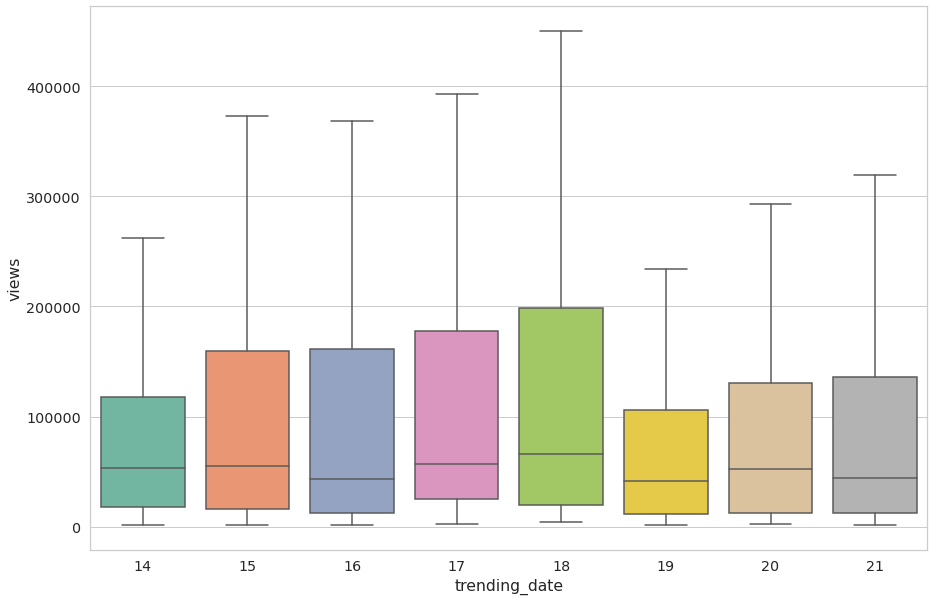

In [23]:
plt.figure(figsize=(15, 10))
sns.boxplot(x = 'trending_date', y = 'views', data = df_youtube, showfliers = False)
plt.show()

Постройте `jointplot` по всем данным для количества просмотров по горизонтальной оси и количества лайков по вертикальной. Насколько информативен такой график?

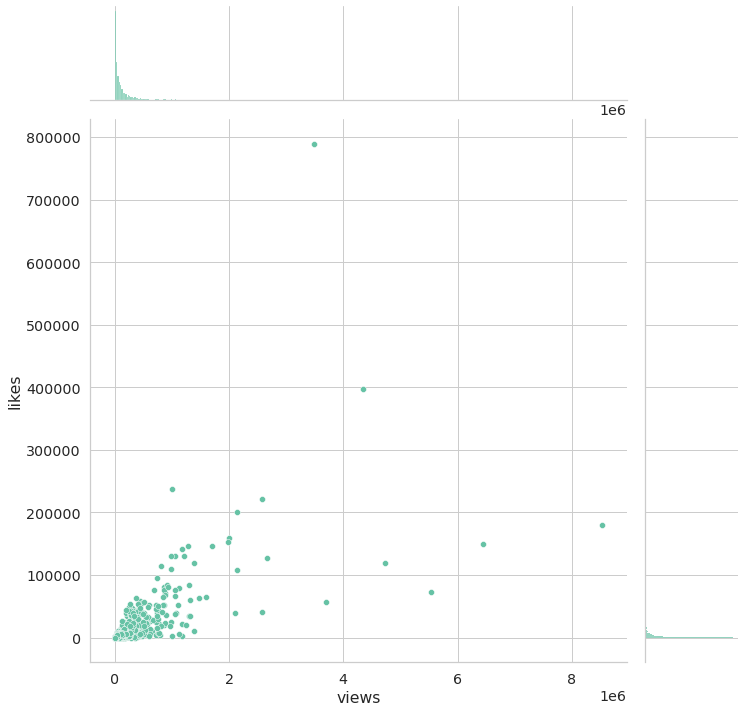

In [24]:
sns.jointplot(x = 'views', y = 'likes', data = df_youtube, height = 10)
plt.show()

По нему мы можем только сказать, что чаще всего встречается не более $2000000$ просмотров и не более $100000$ лайков.

Исправьте этот недостаток.

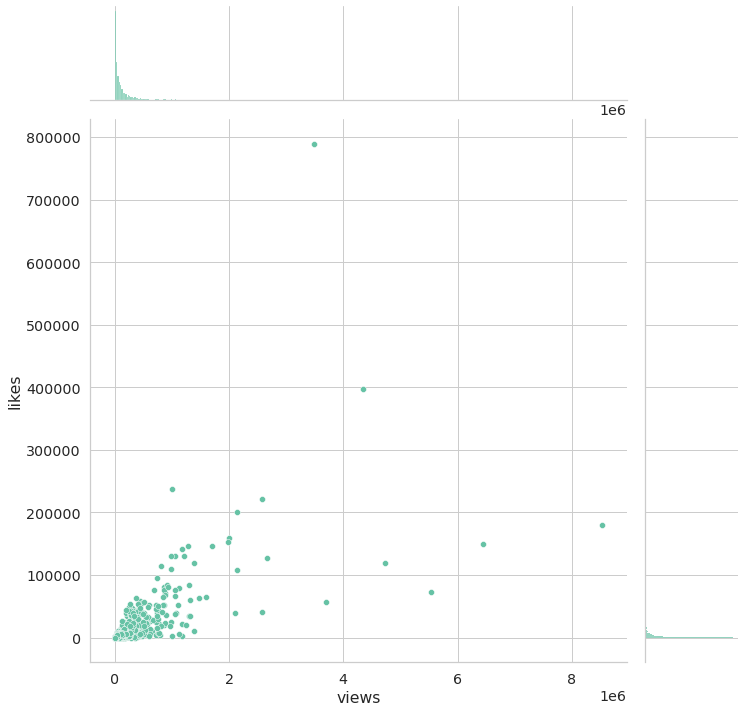

In [25]:
drop_data = df_youtube.copy()
drop_data = drop_data.drop(drop_data[drop_data.likes >100000].index)
drop_data = drop_data.drop(drop_data[drop_data.views >1000000].index)
sns.jointplot(x =  'views', y = 'likes', data = df_youtube, height = 10)
plt.show()


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 3

<a target="_blank" href="https://www.netflix.com">Netflix</a> за последние 5-10 лет обзавелись большим количеством зрителей. С увеличением числа зрителей увеличилось и разнообразие шоу. Соответственно, перед аналитиками из киноиндустрии встала задача исследования данных с рейтингами различных сериалов.  
В данном задании вам предстоит провести визуальный анализ датасета **1000 Netflix Shows** (по состоянию на 11.06.2017) и сделать выводы.  


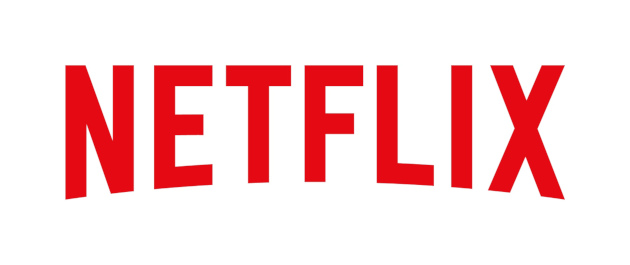

Описание признаков:
* `title` &mdash; название шоу;
* `rating` &mdash; рейтинг шоу. Например: G, PG, TV-14, TV-MA;
* `ratingLevel` &mdash; описание рейтинговой группы и особенностей шоу;
* `release year` &mdash; год выпуска шоу;
* `user rating score` &mdash; оценка пользователей.


Загрузите данные, выполнив код ниже.

In [26]:
data = pd.read_csv('netflix_data.csv', encoding='cp437')
del data['ratingDescription'], data['user rating size']

Удалите из данных дупликаты. Сколько объектов удалено?

In [27]:
data = data.drop_duplicates()
data

,title,rating,ratingLevel,release year,user rating score
0,White Chicks,PG-13,"crude and sexual humor, language and some drug...",2004,82.0
1,Lucky Number Slevin,R,"strong violence, sexual content and adult lang...",2006,NaN
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
3,Prison Break,TV-14,Parents strongly cautioned. May be unsuitable ...,2008,98.0
4,How I Met Your Mother,TV-PG,Parental guidance suggested. May not be suitab...,2014,94.0
...,...,...,...,...,...
989,Russell Madness,PG,some rude humor and sports action,2015,NaN
993,Wiener Dog Internationals,G,General Audiences. Suitable for all ages.,2015,NaN
994,Pup Star,G,General Audiences. Suitable for all ages.,2016,NaN
997,Precious Puppies,TV-G,Suitable for all ages.,2003,NaN


Удалено 500 строк, это мы узнаем из того, что подписано под таблицей. Изначально было 1000 строк, после удаления 500.

Сколько объектов осталось?

In [28]:
data.shape[0]

500

Есть ли в данных пропуски?

Если да, то при дальнейшем анализе подумайте, как их корректнее обработать. Учтите, что многие методы умеют работать с пропусками.

In [29]:
if len(np.where(pd.isna(df))[1]) != 0:
    print("YES")
else:
    print("NO")

YES


Сколько рейтинговых групп представлено в данных?

In [30]:
len(data['rating'].unique())

13

Какие оценки пользователи ставят чаще? Постройте гистограмму оценок.

In [31]:
df_without_nan = data.dropna()
df_without_nan.iloc[:,4].value_counts().idxmax()

97.0

array([[<AxesSubplot:title={'center':'user rating score'}>]], dtype=object)

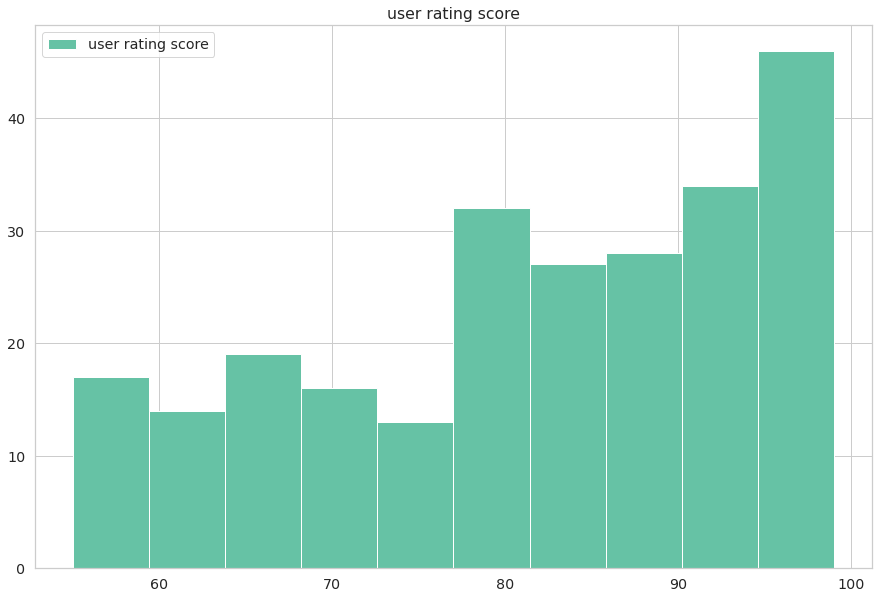

In [32]:
df_without_nan.hist(column = 'user rating score',figsize=[15,10],legend='True')

**Вывод:** Чаще всего пользователи ставят высокие оценки, совсем низкие оценки не ставят.

Выведите основную информацию об оценках пользователей: среднее, стандартное отклонение, минимум, максимум, медиана. Отличаются ли медиана и среднее? Могут ли данные характеристики значительно отличаться? Почему?

In [33]:
df_without_nan['user rating score'].describe()

count    246.000000
mean      81.390244
std       12.677883
min       55.000000
25%       71.000000
50%       83.500000
75%       92.750000
max       99.000000
Name: user rating score, dtype: float64

In [34]:
df_without_nan['user rating score'].median()

83.5

**Ответ:** Медиана и среднее отличаются, но не сильно. В теории да, они могут сильно отличаться. Условно, если у нас данные это все 1 и 2 огромных числа. Тогда среднее может быть не очень маленьким, а медиана точно будет равна 1.

В какие годы были запущены шоу, представленные в датасете?

In [35]:
data = data.sort_values('release year')
data['release year'].unique()

array([1940, 1976, 1978, 1982, 1986, 1987, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       2016, 2017])

Постройте график, показывающий распределение количества запущенных шоу в зависимости от года. Наблюдается ли рост? Есть ли выбросы?

<AxesSubplot:xlabel='release year'>

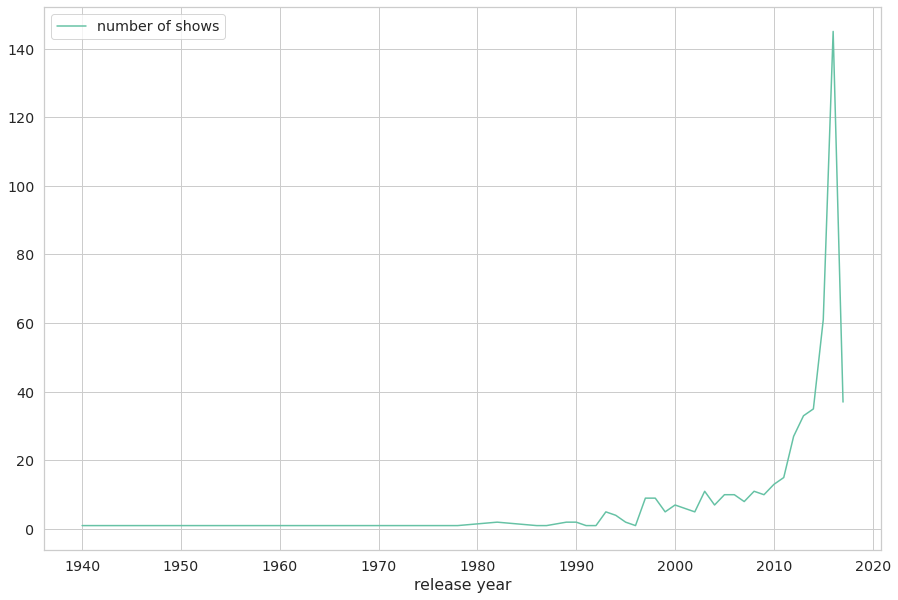

In [36]:
number_of_shows_years = data.groupby('release year').title.nunique().to_frame('number of shows').reset_index()
number_of_shows_years.plot('release year', 'number of shows', figsize=[15,10])

**Вывод:** Монотонного роста нет, в рйоне 2016 года наблюдается аномальный скачок запущенных шоу.

Сравните среднюю оценку пользователей в 2016 со средней оценкой в 2017. Можно ли сделать вывод, что 2017 год успешнее для Netflix? "Успешнее" означает, что пользователи в среднем ставили более высокие оценки.
Ответить на этот вопрос вам поможет график, который вы построили выше.

In [37]:
table_for_years = df_without_nan.pivot_table('user rating score','release year', aggfunc=np.mean)
table_for_years.tail(2)

,user rating score
release year,
2016,85.060976
2017,87.000000


In [38]:
table_for_years = df_without_nan.pivot_table('user rating score','release year', aggfunc=np.median)
table_for_years.tail(2)

,user rating score
release year,
2016,90.0
2017,89.0


**Вывод:** Среднее значение рейтинга в 2017 году больше чем в 2016, но по этим данным нельзя сказать, что он успешнее. Медианное значение у 2016 года больше чем у 2017, поэтому , скорее всего, в 2017 году больше высоких оценок, чем в 2016, но при этом в среднем лучшие оценки в 2016 году. Но при этом в 2016 году было запущено намного больше шоу, чем в 2017 (а средние оценки при этом не сильно отличаются). Так что можно сказать, что 2016 был успешнее.

Ниже представлены два графика, показывающие распределение шоу по рейтинговым группам. Какой тип графика визуально более интерпретируемый? [Подсказка](https://mipt-stats.gitlab.io/courses/ad_fivt/Jobs.jpg)

Постройтре самостоятельно график, который считаете более интерпретируемым. Сделайте вывод.

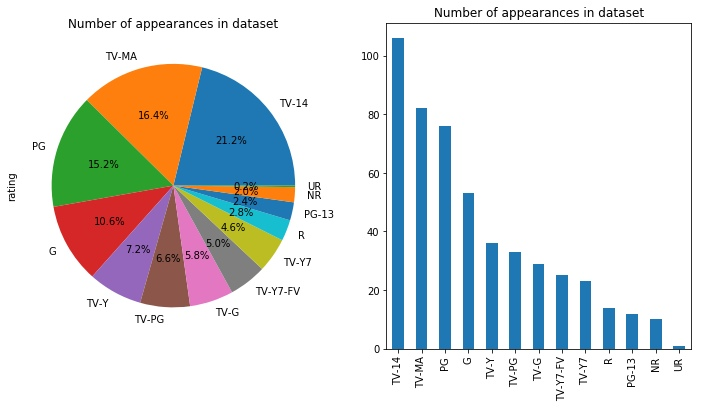

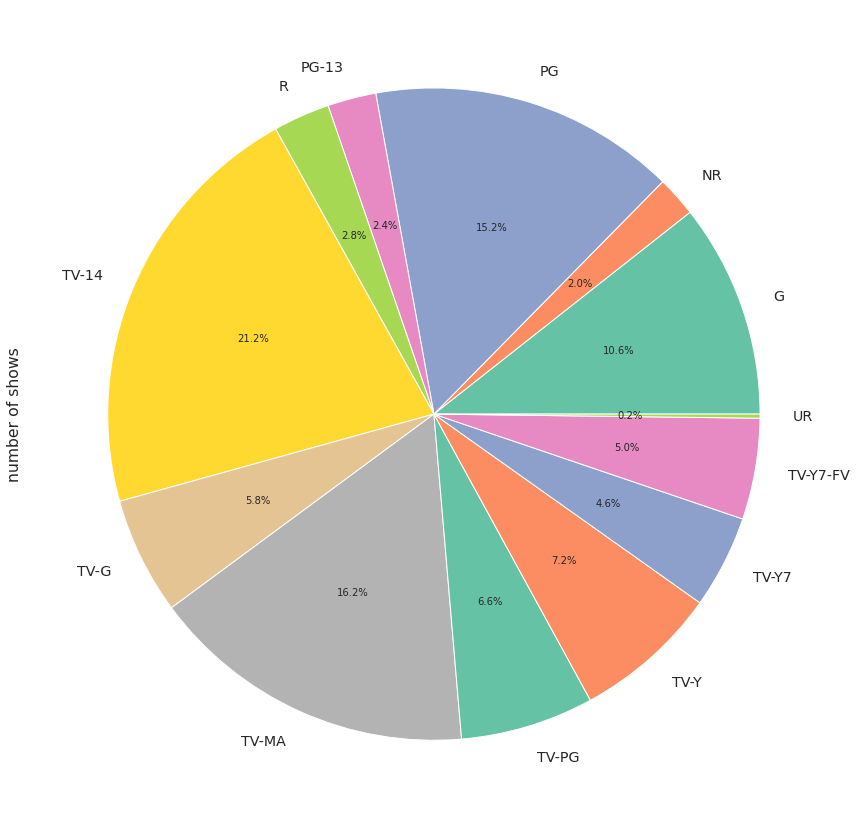

In [39]:
number_of_shows_in_reiting_group = data.groupby('rating').title.nunique().to_frame('number of shows').reset_index()
number_of_shows_in_reiting_group.plot(kind='pie', y = 'number of shows', shadow=False, autopct='%1.1f%%',
                                      labels=number_of_shows_in_reiting_group['rating'], 
                                      legend = False, figsize=(15,15))
plt.show()

**Вывод:** Больше всего снимают шоу с категорией TV-14 и TV-MA, то есть больше всего шру снимается не для детей(в принципе логино).

Составьте топ-13 самых высоко оцененных шоу. Выберите из данного топа шоу, которое вам наиболее нравится. Обозначим это шоу N.
Ответьте на следующие вопросы.
* Какое шоу является худшим по оценкам в рейтинговой группе, к которой принадлежит N?  
* Сколько шоу было выпущено в одном году с N?  
* Насколько бы изменилась средняя оценка шоу, выпущенных в одном году с N, если бы Netflix не запустили шоу N?

In [40]:
raiting_data = data.sort_values('user rating score',ascending = False, na_position = 'last')
raiting_data.head(13)

,title,rating,ratingLevel,release year,user rating score
41,13 Reasons Why,TV-MA,For mature audiences. May not be suitable for...,2017,99.0
64,Friends,TV-14,Parents strongly cautioned. May be unsuitable ...,2003,98.0
62,Family Guy,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
8,The Walking Dead,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
10,Once Upon a Time,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0
350,Lost,TV-14,Parents strongly cautioned. May be unsuitable ...,2010,98.0
63,Criminal Minds,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
72,Orange Is the New Black,TV-MA,For mature audiences. May not be suitable for...,2016,98.0
27,The Flash,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0


Пусть N это "Sherlock" 

In [41]:
raiting_data.loc[raiting_data['title'] == 'Sherlock']

,title,rating,ratingLevel,release year,user rating score
11,Sherlock,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,95.0


Самое худшее по оценкам в рейтинговой группе, к которой принадлежит "Sherlock" 

In [42]:
same_raiting = raiting_data.dropna()
same_raiting = same_raiting.loc[raiting_data['rating'] == 'TV-14']
same_raiting.tail(2)

,title,rating,ratingLevel,release year,user rating score
179,Haters Back Off,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,58.0
212,Being Human (U.S.),TV-14,Parents strongly cautioned. May be unsuitable ...,2014,58.0


Сколько шоу было выпущено в одном году с N? 

In [43]:
same_year = raiting_data.loc[raiting_data['release year'] == 2016]
same_year.shape[0]

146

Насколько бы изменилась средняя оценка шоу, выпущенных в одном году с N, если бы Netflix не запустили шоу N?

In [44]:
with_N = same_year['user rating score'].mean()
table_without = same_year.drop(same_year[same_year.title == 'Sherlock'].index)
without = table_without['user rating score'].mean()
with_N - without

0.1257181942544463

Ответьте на следующие вопросы, проанализировав `boxplot`-график.
* Какую рейтинговую группу зрители оценивали выше всего в последние пять лет, за которые есть данные? 
* Как менялись оценки пользователей с течением времени? Постройте `boxplot` для каждого десятилетия.

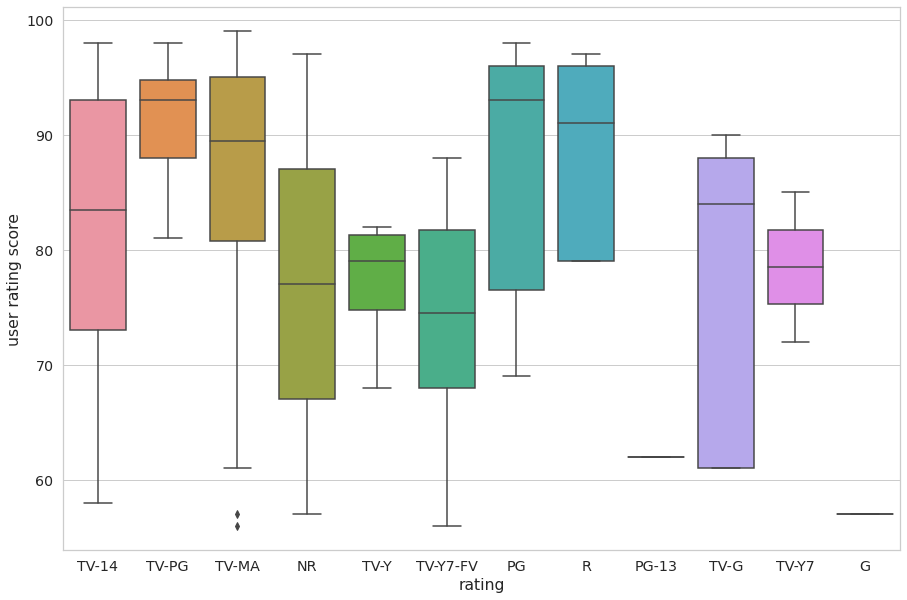

In [45]:
df_without_nan = df_without_nan[df_without_nan['release year']>2012]
plt.figure(figsize=(15, 10))
sns.boxplot(x = 'rating', y = 'user rating score', data = df_without_nan)
plt.show()

In [46]:
raiting_year = data.dropna()
year_2010 = raiting_year[raiting_year['release year'] >=2010]
year_2000 = raiting_year[(raiting_year['release year'] >=2000) & (raiting_year['release year'] < 2010)]
year_1990 = raiting_year[(raiting_year['release year'] >=1990) & (raiting_year['release year'] < 2000)]
year_1980 = raiting_year[(raiting_year['release year'] >=1980) & (raiting_year['release year'] < 1990)]
year_1970 = raiting_year[(raiting_year['release year'] >=1970) & (raiting_year['release year'] < 1980)]
year_1960 = raiting_year[(raiting_year['release year'] >=1960) & (raiting_year['release year'] < 1970)]
year_1950 = raiting_year[(raiting_year['release year'] >=1950) & (raiting_year['release year'] < 1960)]
year_1940 = raiting_year[(raiting_year['release year'] >=1940) & (raiting_year['release year'] < 1950)]
year_2010.name = "Between 1940 and 1950"
array_of_years = [year_2010, year_2000, year_1990, year_1980, year_1970]

За 1950-1970 годы нет телевизионных шоу. Оценка 0 значит, что у шоу нет пользовательской оценки.

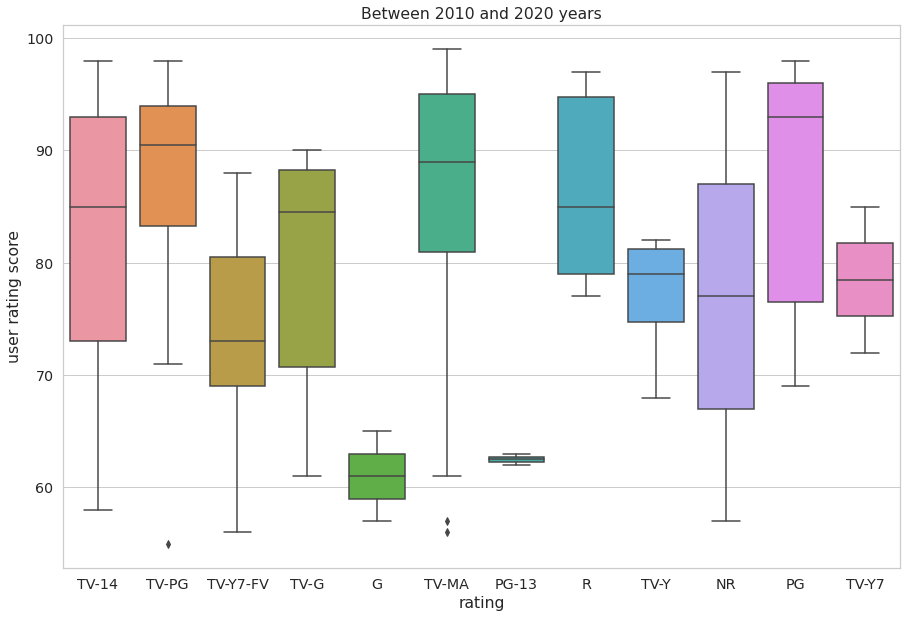

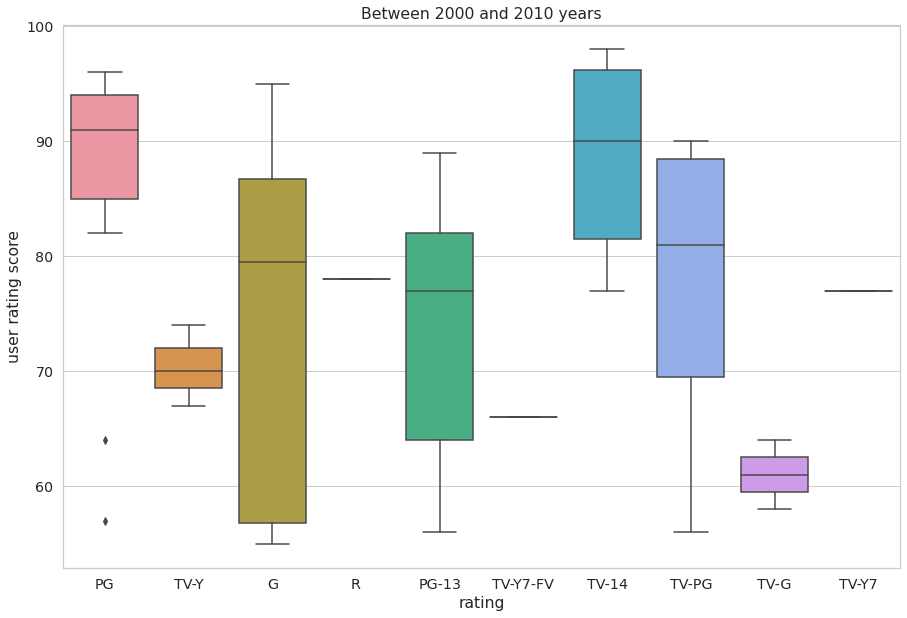

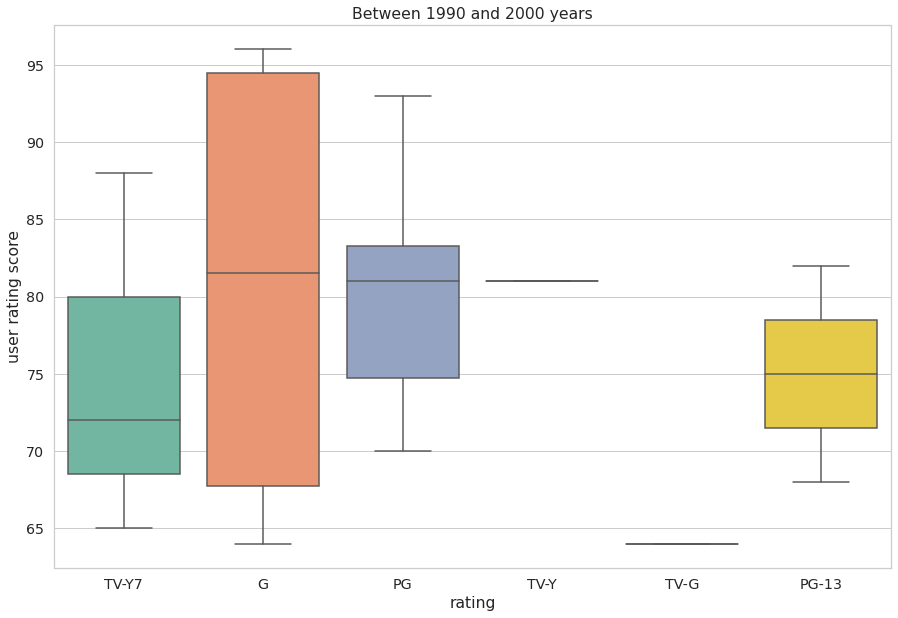

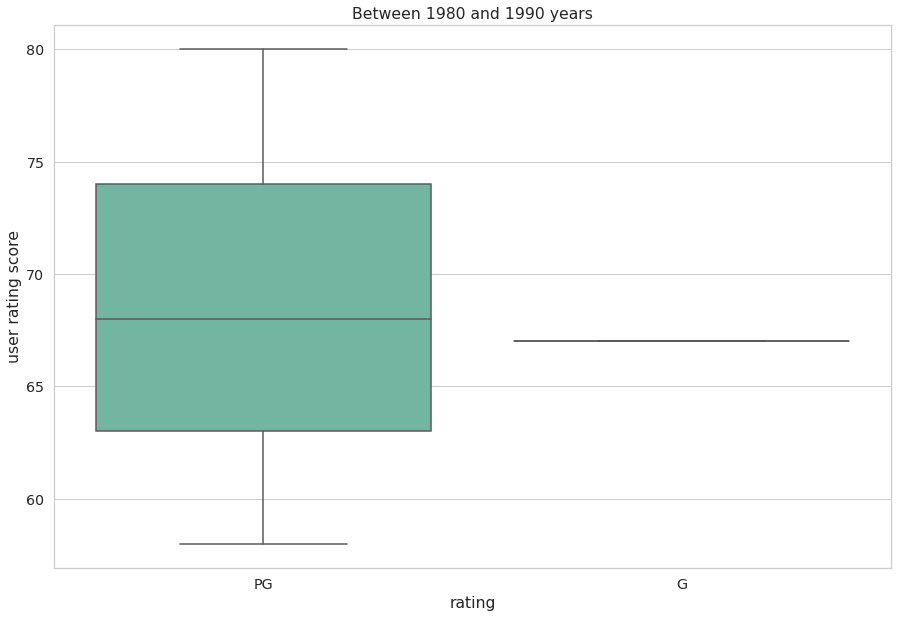

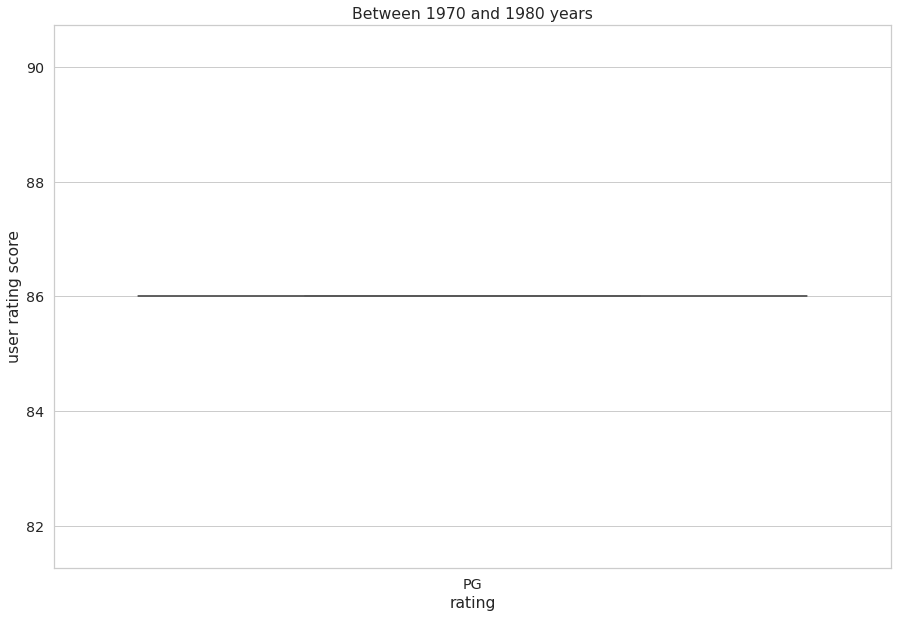

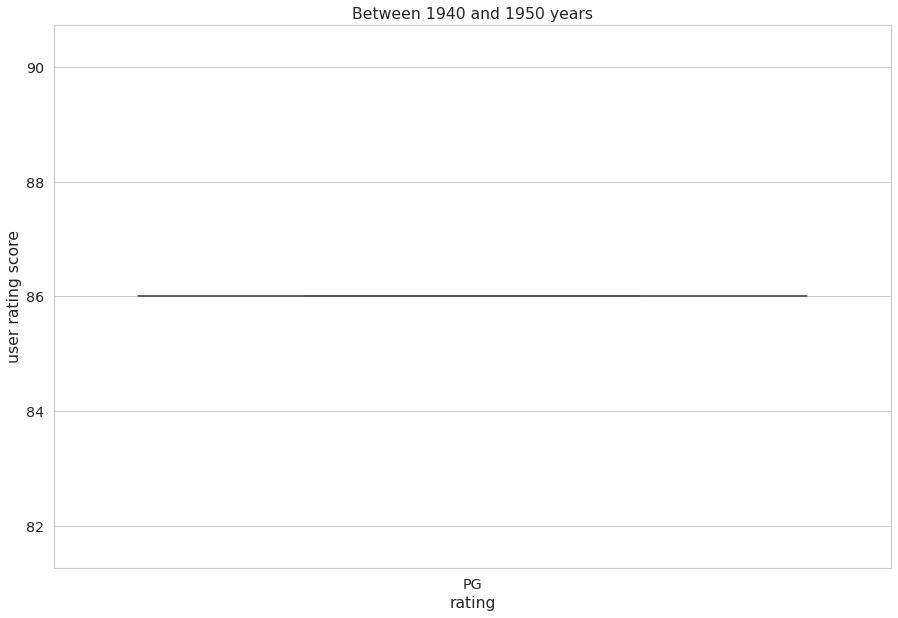

In [47]:
i = 2010
j = 2020
for period in array_of_years:
    plt.figure(figsize=(15, 10))
    title = "Between " + str(i) + " and " + str(j) + " years"
    sns.boxplot(x = 'rating', y = 'user rating score', data = period).set_title(title)
    plt.show()
    i -= 10
    j -= 10
plt.figure(figsize=(15, 10))
title = "Between 1940 and 1950 years"
sns.boxplot(x = 'rating', y = 'user rating score', data = period).set_title(title)
plt.show()

**Вывод:** PG зрители оценивали выше всего в последние пять лет, за которые есть данные. Со временем пользователи стали больше оценивать шоу. В юболее древних годах очень мало оценок и они все одинаковые. Чем ближе к нашему времени, тем больше оценок стало появляться. Но при этом нет четкой зависимости оценок от десятилетия.

---
### Задача 4

В данной задаче вам нужно будет продолжить анализ данных о видео на YouTube. Информация об имени категории видео содержится в файле `RU_category_id.json`. Следующий код читает этот файл, извлекает из него необходимую информацию, и записывает в виде `pandas`-таблицы.

In [48]:
import json

with open('./RU_category_id.json') as json_file:
    json_data = json.load(json_file)
    
category = pd.DataFrame(columns=['id', 'name'])

for item in json_data['items']:
    category = category.append(
        {'id': int(item['id']),
         'name': item['snippet']['title']},
        ignore_index=True
    )
    
category['id'] = category['id'].astype(int)
category

,id,name
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


Добавьте к вашим данным имена категорий с помощью `pd.merge`.

In [49]:
df_new = df_youtube.merge(category, how = 'left', left_on = 'category_id', right_on = 'id')
df_for_future = df_for_future.merge(category, how = 'left', left_on = 'category_id', right_on = 'id')
df_new

,trending_date,category_id,views,likes,dislikes,comment_count,id,name
0,14,22,62408,334,190,50,22.0,People & Blogs
1,14,22,330043,43841,2244,2977,22.0,People & Blogs
2,14,24,424596,49854,714,2944,24.0,Entertainment
3,14,22,112851,3566,122,80,22.0,People & Blogs
4,14,24,243469,36216,631,1692,24.0,Entertainment
...,...,...,...,...,...,...,...,...
1595,21,2,5498,373,19,49,2.0,Autos & Vehicles
1596,21,2,40394,1339,179,201,2.0,Autos & Vehicles
1597,21,25,3516,65,7,4,25.0,News & Politics
1598,21,25,47507,4372,231,2380,25.0,News & Politics


Составьте сводную таблицу о количестве просмотров по дням для каждой категории видео с помощю функции `pivot_table`.

In [50]:
table_for_categories = df_new.pivot_table(values = 'views',index = 'name',columns = 'trending_date', aggfunc=np.sum)
table_for_categories

trending_date,14,15,16,17,18,19,20,21
name,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0


Визуализируйте таблицу с помощью `heatmap`. Для информативности поделите все числа на $10^6$.

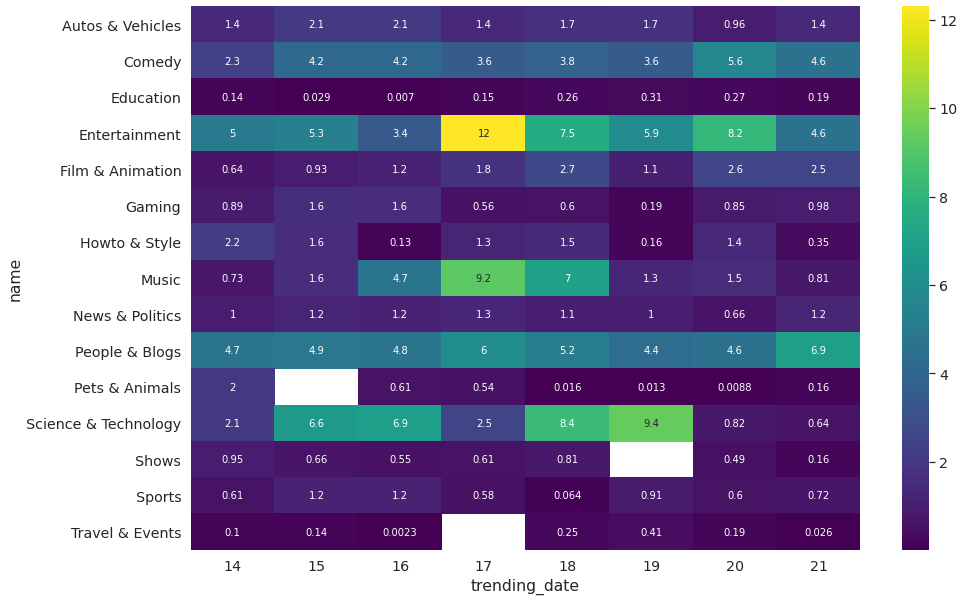

In [51]:
table_for_categories = table_for_categories/1000000
plt.figure(figsize=(15, 10))
sns.heatmap(table_for_categories, cmap="viridis", annot = True)
plt.show()

Сделайте аналогичную сводную таблицу, добавив суммы по строкам и столбцам, назвав их "Всего просмотров".

In [52]:
table_with_all=df_new.pivot_table(values = 'views',index = 'name',
                                  columns = 'trending_date', aggfunc=np.sum, margins=True)
table_with_all

trending_date,14,15,16,17,18,19,20,21,All
name,,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0,12699222
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0,31814553
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0,1346879
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0,52130273
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0,13457229
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0,7262095
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0,8511357
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0,26858213
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0,8616728


В чем проблема с информативностью подобных таблиц? Исправьте это.

*Подсказка*: посмотрите на графики, которые вы построили ранее. 

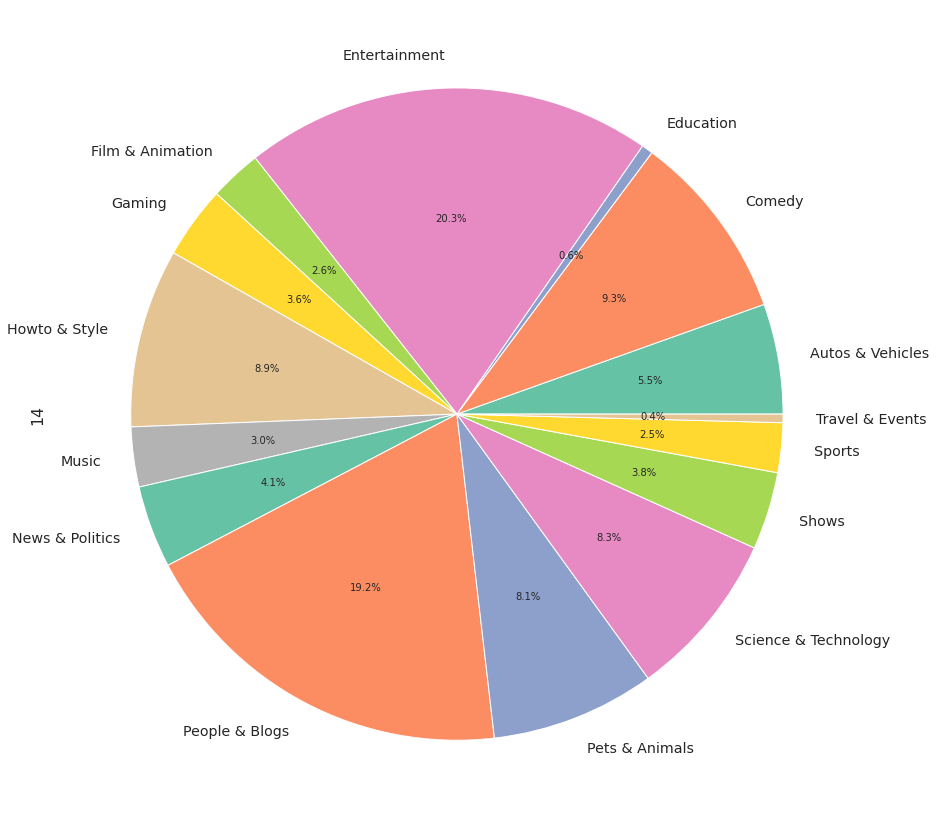

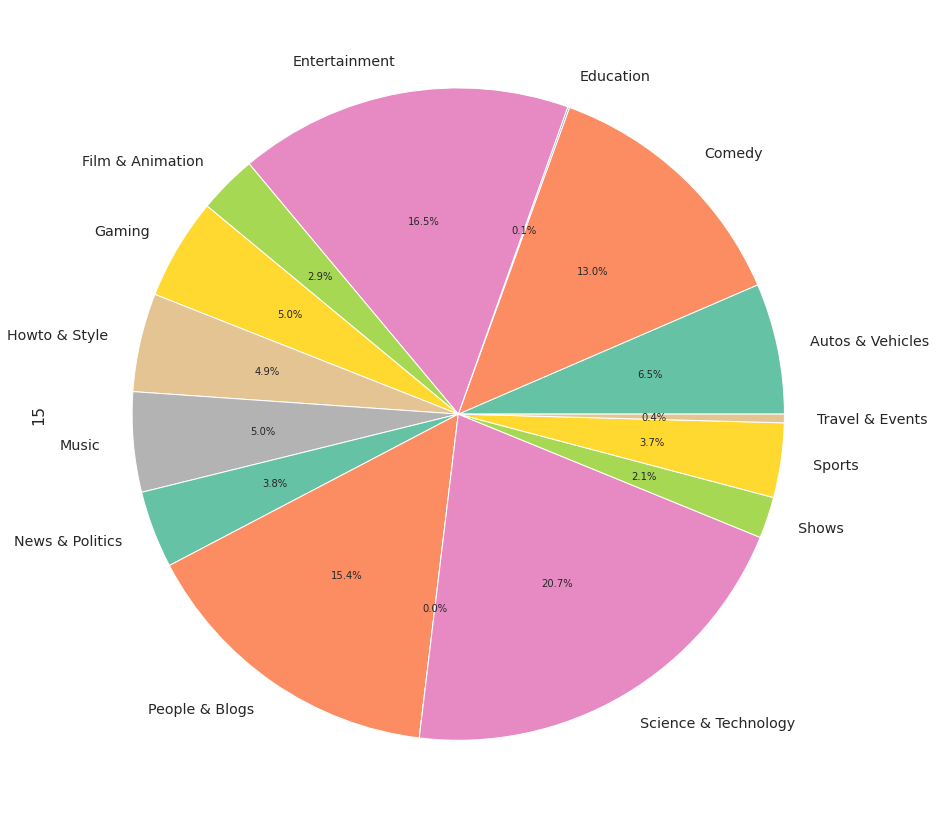

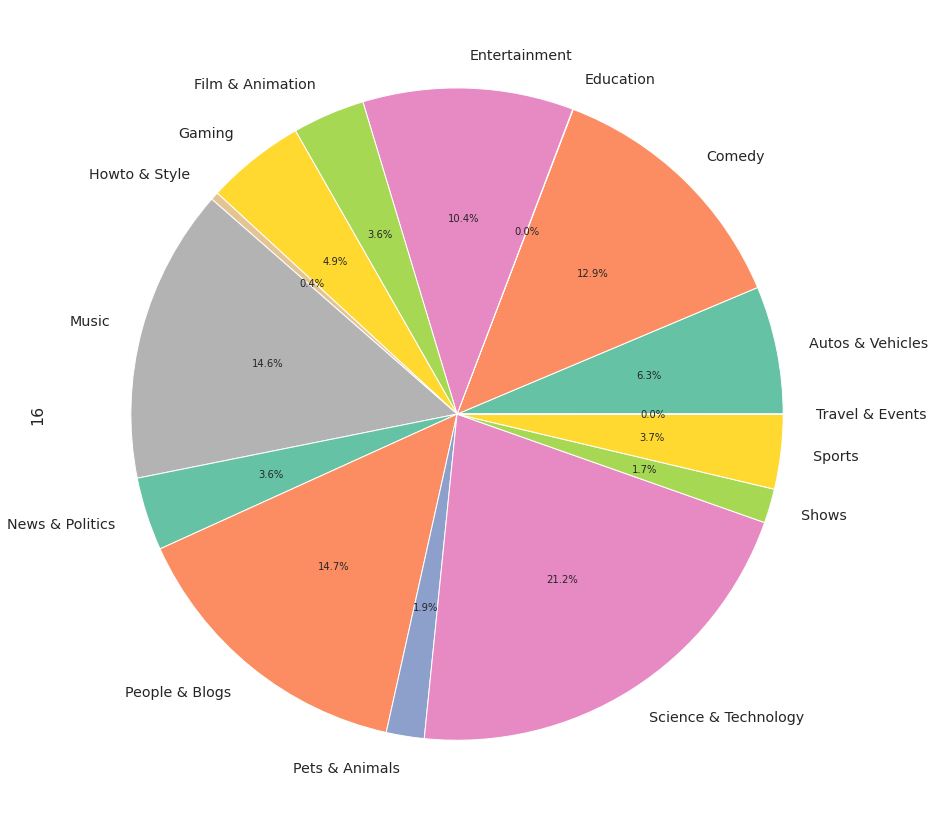

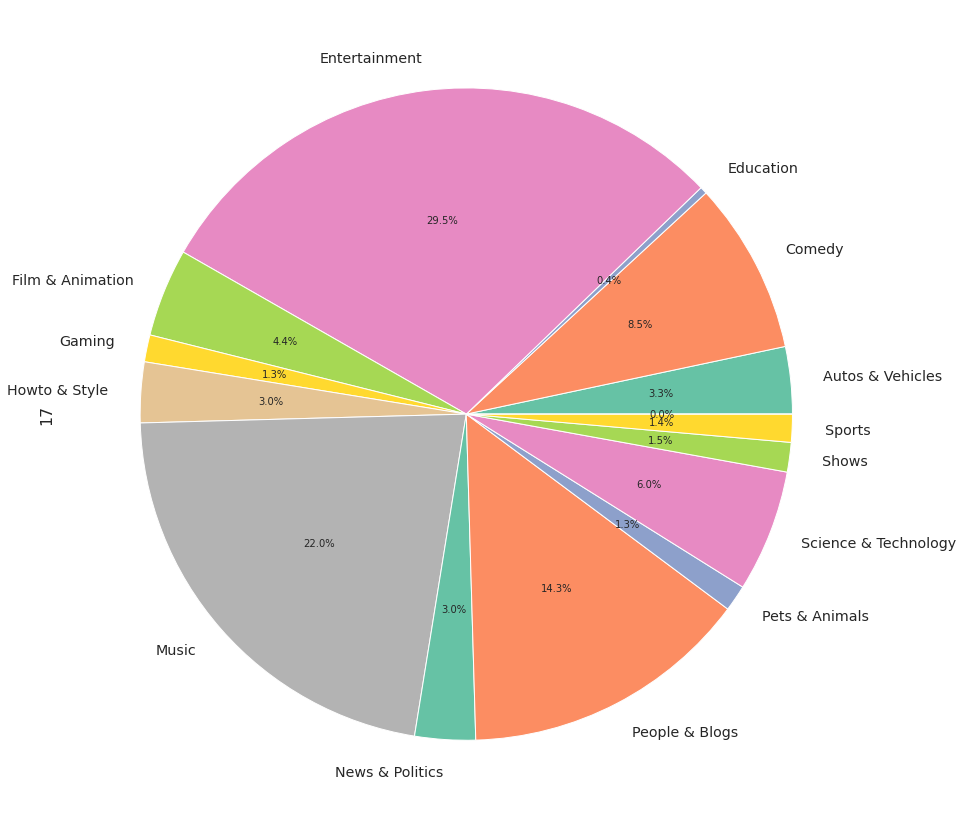

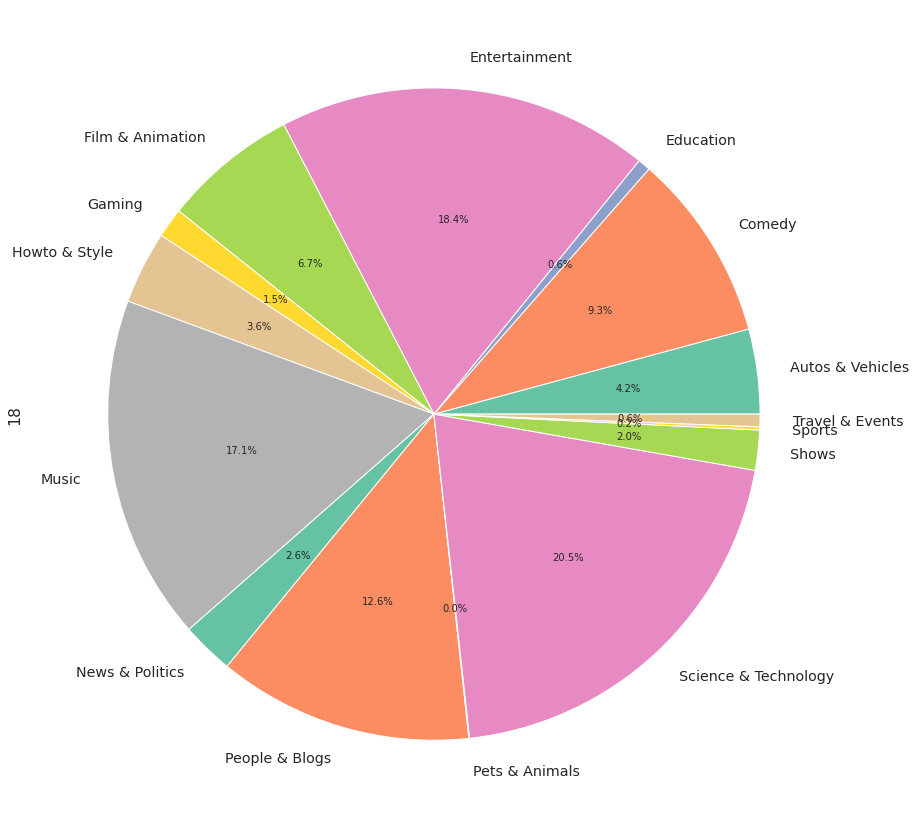

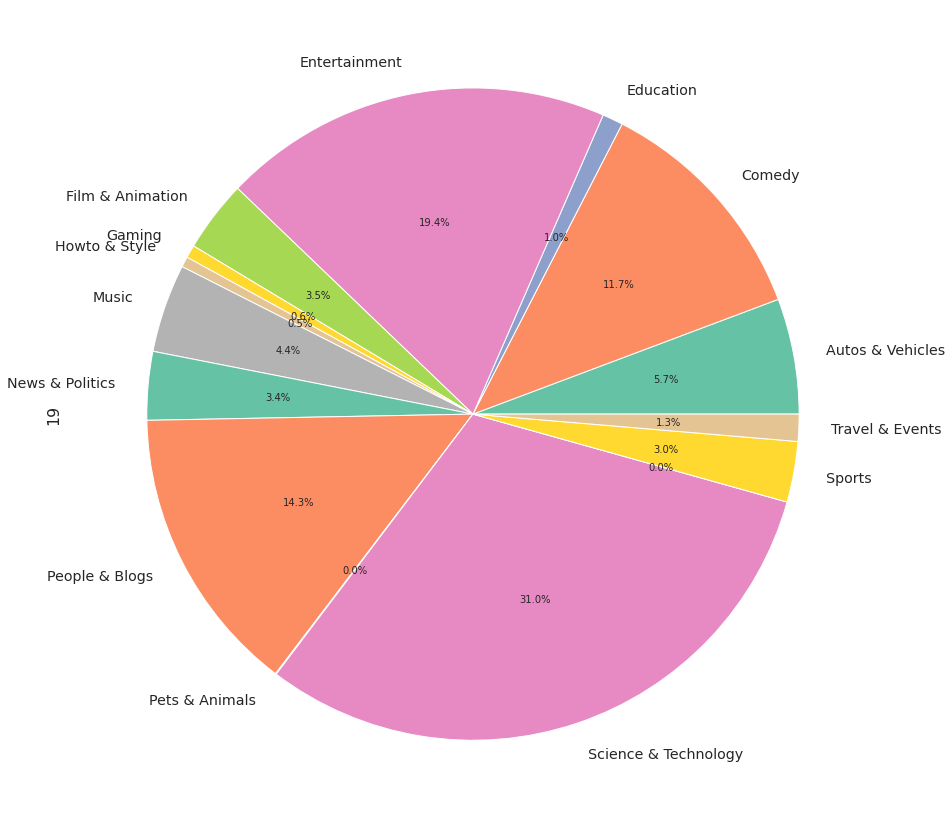

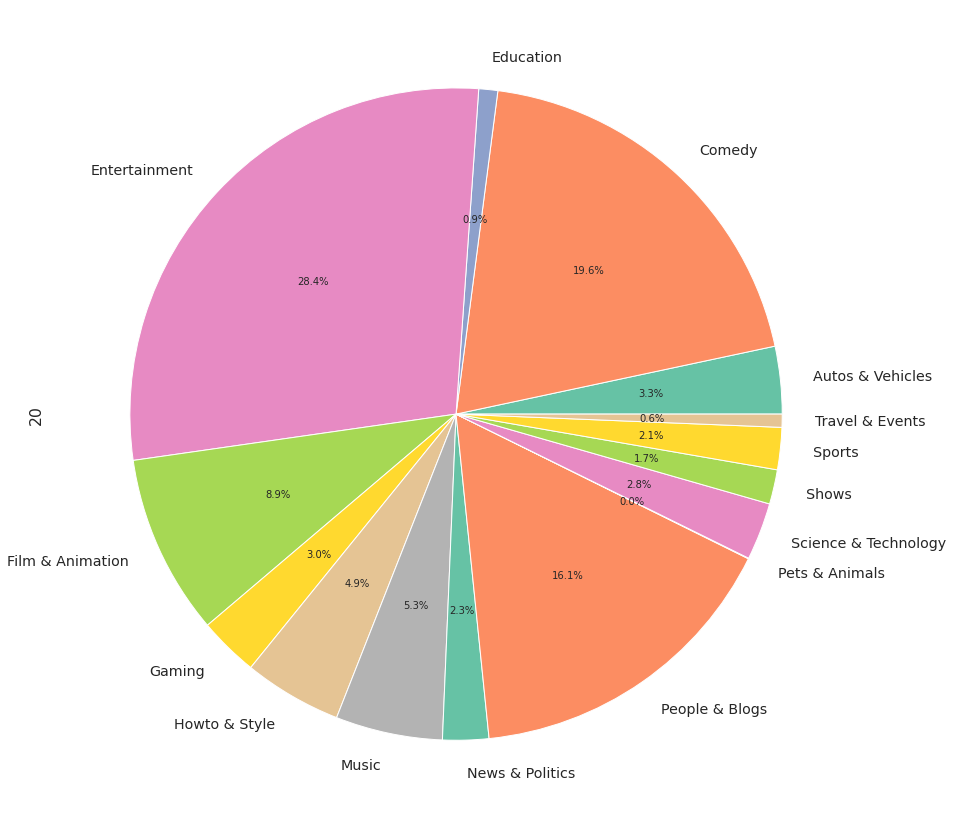

In [53]:
table_with_all = table_with_all.drop(['All'], axis = 0)
table_with_all = table_with_all.reset_index()
for i in range(14, 22):
    table_with_all.plot(kind='pie', y = i, shadow=False, autopct='%1.1f%%',
                                          labels=table_with_all['name'], 
                                          legend = False, figsize=(15,15))
    plt.show()
    i = i + 1

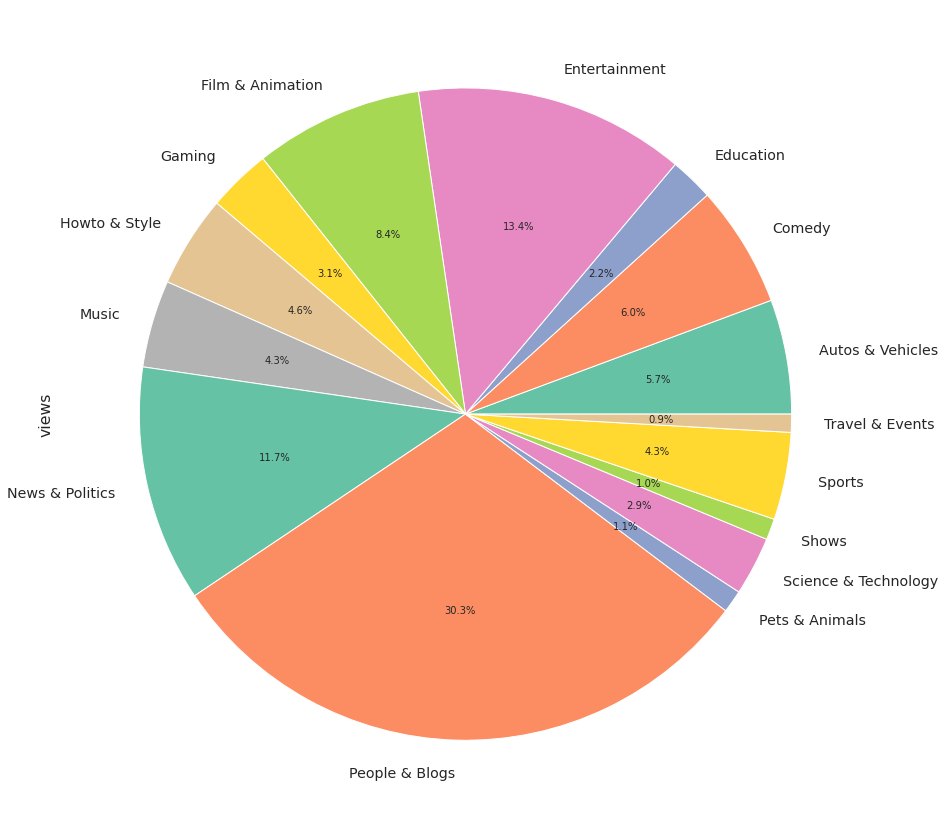

In [54]:
df_for_future = df_for_future.groupby('name').title.nunique().to_frame('views').reset_index()
df_for_future.plot(kind='pie', y = 'views', shadow=False, autopct='%1.1f%%',
                                      labels=df_for_future['name'], 
                                      legend = False, figsize=(15,15))
plt.show()

**Вывод:** По таким таблицам очень сложно смотреть данные. Наглядно данные за все периоды лучше смотреть по круговой диаграмме. Больше всего виде

---

### Задача 5

<a target="_blank" href="yelp.com">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

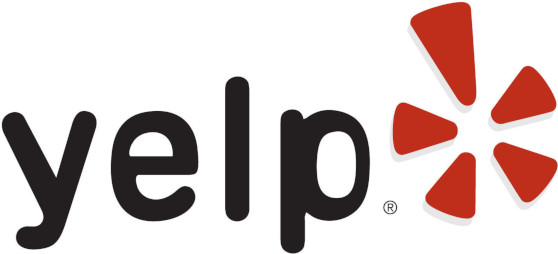

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [55]:
df = pd.DataFrame(pd.read_csv('yelp_business.csv', delimiter=','))
df.head()

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [56]:
city = df.groupby('city').name.count().to_frame('name').reset_index()
city = city.sort_values('name', ascending = False)
city.head(5)

,city,name
424,Las Vegas,26775
713,Phoenix,17213
983,Toronto,17206
143,Charlotte,8553
871,Scottsdale,8228


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

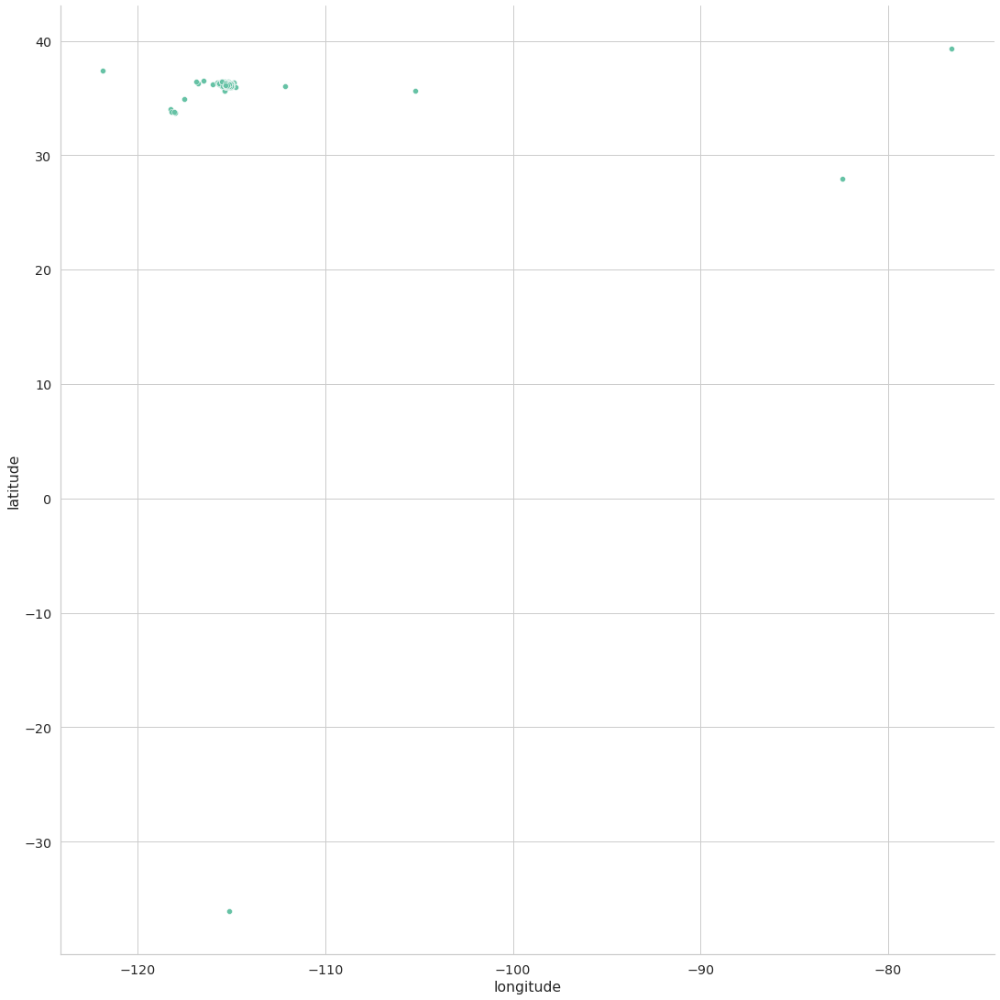

In [57]:
las_vegas = df[df['city'] == 'Las Vegas']
map_cities = sns.relplot(x = 'longitude', y = 'latitude', data = las_vegas, height=15)

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. 

На этом графике должны выделяться некоторые улицы. Откройте карту города `N` и сравните ее с построенным графиком. Попробуйте также для графиков в этой задаче автоматически подгружать карту города в качестве фона графика, используя <a href="https://plotly.com/python/scattermapbox/">примеры</a>.

*Замечание. Если у вас возникает ошибка `Notebook validation failed`, попробуйте открыть ноутбук текстовым редактором и в самом конце заменить `"nbformat_minor": 1` на `"nbformat_minor": 4`.*

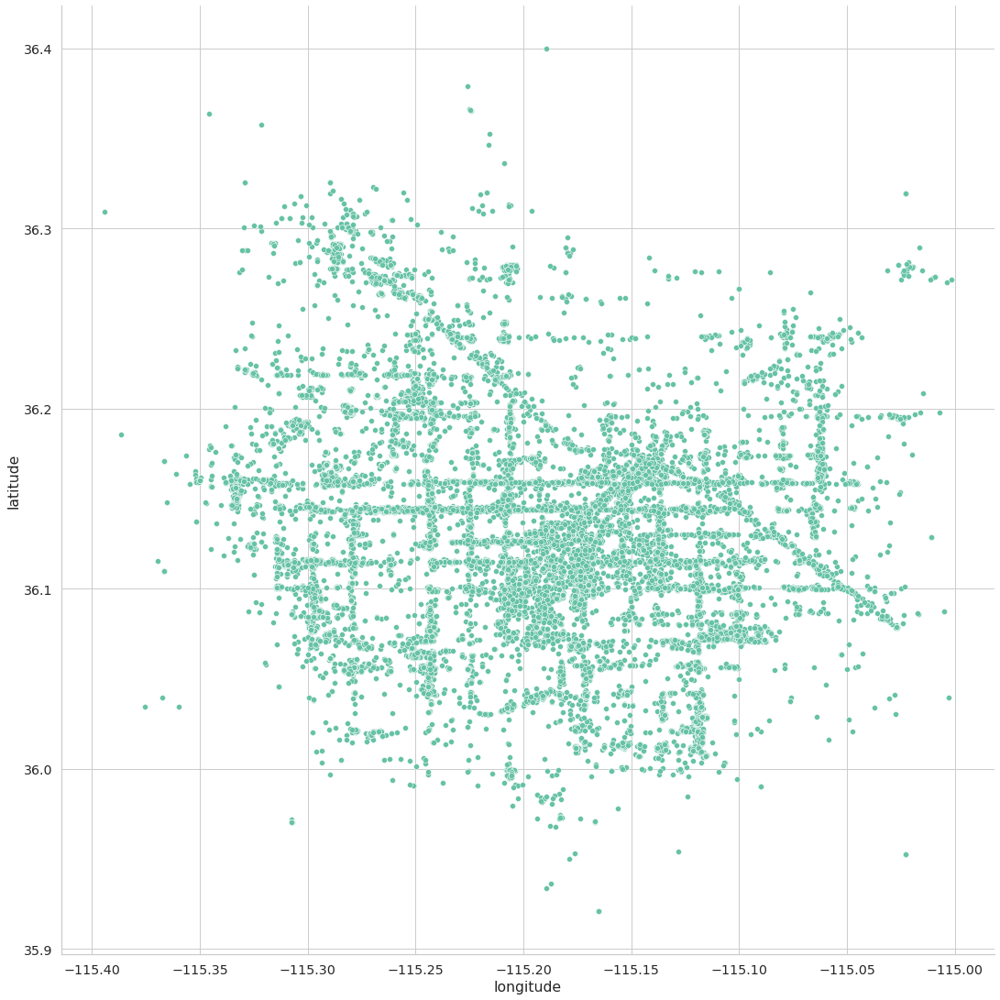

In [58]:
las_vegas = las_vegas.loc[(las_vegas['longitude'] < -115) 
                          & (las_vegas['longitude'] > -115.4) 
                          & (las_vegas['latitude'] < 36.4) 
                          & (las_vegas['latitude'] > 35.8)]
map_cities = sns.relplot(x = 'longitude', y = 'latitude', data = las_vegas, height=15)

In [59]:
fig = px.scatter_mapbox(las_vegas, lat="latitude", lon="longitude", hover_name="name",zoom = 10, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [60]:
review = pd.DataFrame(pd.read_csv('yelp_review.csv', delimiter=','))
review

,Unnamed: 0,business_id,stars
0,0,AEx2SYEUJmTxVVB18LlCwA,5
1,1,VR6GpWIda3SfvPC-lg9H3w,5
2,2,CKC0-MOWMqoeWf6s-szl8g,5
3,3,ACFtxLv8pGrrxMm6EgjreA,4
4,4,s2I_Ni76bjJNK9yG60iD-Q,4
...,...,...,...
5261663,5261663,Ngk84Ax1tXgpoJFEGxot3w,1
5261664,5261664,pOEL97ld-FJMKO8Ki8JmYg,3
5261665,5261665,5ubokMNw8qfbX2WtxgJG1Q,4
5261666,5261666,EO3i5kTUG7_S2OIQ23sdSA,3


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [61]:
review.set_index('business_id', inplace = True)
array = df['business_id'][df['city'] == 'Las Vegas']
array = list(array)
review = review.loc[array]
review = review.reset_index('business_id')
review

,business_id,Unnamed: 0,stars
0,kCoE3jvEtg6UVz5SOD3GVw,456053,4
1,kCoE3jvEtg6UVz5SOD3GVw,1093900,1
2,kCoE3jvEtg6UVz5SOD3GVw,2039047,5
3,kCoE3jvEtg6UVz5SOD3GVw,2979380,5
4,kCoE3jvEtg6UVz5SOD3GVw,4844650,5
...,...,...,...
1604222,9ouC6BpmjFpLfHeQnLQqng,4857506,5
1604223,9ouC6BpmjFpLfHeQnLQqng,5256464,5
1604224,n9a-3YhibkMDUEgncIivHg,779637,5
1604225,n9a-3YhibkMDUEgncIivHg,1222296,1


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [62]:
review_for_each_company = review[['business_id', 'stars']]
info_with_stars = review_for_each_company.groupby(['business_id']).aggregate([np.mean, np.size])
info_with_stars = info_with_stars.reset_index('business_id')
info_with_stars.columns = info_with_stars.columns.droplevel(0)
info_with_stars.columns = ['business_id', 'mean', 'size']
info_with_stars

,business_id,mean,size
0,--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
1,--DdmeR16TRb3LsjG0ejrQ,3.200000,5
2,--WsruI0IGEoeRmkErU5Gg,4.928571,14
3,--Y7NhBKzLTbNliMUX_wfg,4.875000,8
4,--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...,...
26770,zzOo9n22fBbKAhbSpMzggA,3.230769,26
26771,zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
26772,zzjqFOujmM9surbMANZ_ag,5.000000,3
26773,zzsKbL1KMNJqazSqBXskxQ,3.666667,6


Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша.

In [63]:
beautiful_info_with_stars = info_with_stars.copy()
beautiful_info_with_stars.columns = ['Business id of name', 'Average number of stars',
                                     'Number of stars in company']
beautiful_info_with_stars

,Business id of name,Average number of stars,Number of stars in company
0,--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
1,--DdmeR16TRb3LsjG0ejrQ,3.200000,5
2,--WsruI0IGEoeRmkErU5Gg,4.928571,14
3,--Y7NhBKzLTbNliMUX_wfg,4.875000,8
4,--e8PjCNhEz32pprnPhCwQ,3.473684,19
...,...,...,...
26770,zzOo9n22fBbKAhbSpMzggA,3.230769,26
26771,zzXuJF6UUT1kgTyCsmgDmQ,5.000000,4
26772,zzjqFOujmM9surbMANZ_ag,5.000000,3
26773,zzsKbL1KMNJqazSqBXskxQ,3.666667,6


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [64]:
info_with_stars.set_index('business_id', inplace = True)
las_vegas.set_index('business_id', inplace = True)

total_table = las_vegas.join(info_with_stars, how = 'left', lsuffix = 'business_id', rsuffix = 'business_id')

info_with_stars = info_with_stars.reset_index('business_id')
las_vegas = las_vegas.reset_index('business_id')
total_table = total_table.reset_index('business_id')
total_table = total_table[['latitude','longitude', 'categories', 'name', 'mean', 'size']]
total_table.rename(columns = {'mean':'average_number_of_stars'}, inplace = True)
total_table.rename(columns = {'size':'number_of_reviews'}, inplace = True)
total_table

,latitude,longitude,categories,name,average_number_of_stars,number_of_reviews
0,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
1,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
2,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
3,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
4,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.680000,25
...,...,...,...,...,...,...
26680,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
26681,36.173589,-115.116779,Coffee & Tea;Food,"""Starbucks""",2.400000,35
26682,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",3.857143,35
26683,36.128780,-115.208990,Martial Arts;Sports Wear;Men's Clothing;Sporti...,"""9 Dragons Fight Shop""",5.000000,5


Так как мы храним в информации про город только те компании, которые находятся прямо в нем, а не приписаны в нем, то в нашей таблице меньше строк, чем имеется в оценках. Так как в оценках считаются все компании.

Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

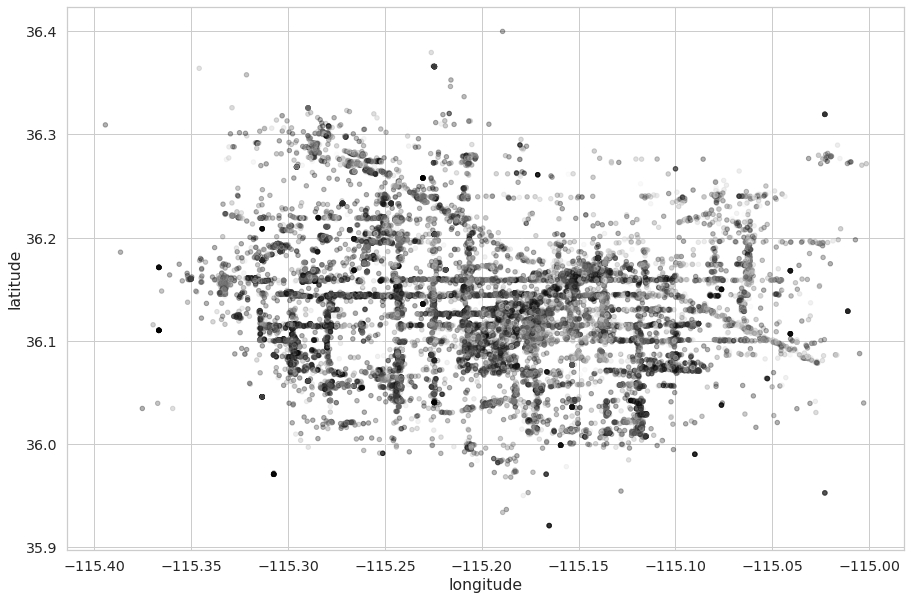

In [65]:
array = total_table['average_number_of_stars']
array = list(array)
total_table.plot(x = 'longitude', y = 'latitude', kind = 'scatter',c = array ,alpha = 0.3, figsize = [15, 10])
plt.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

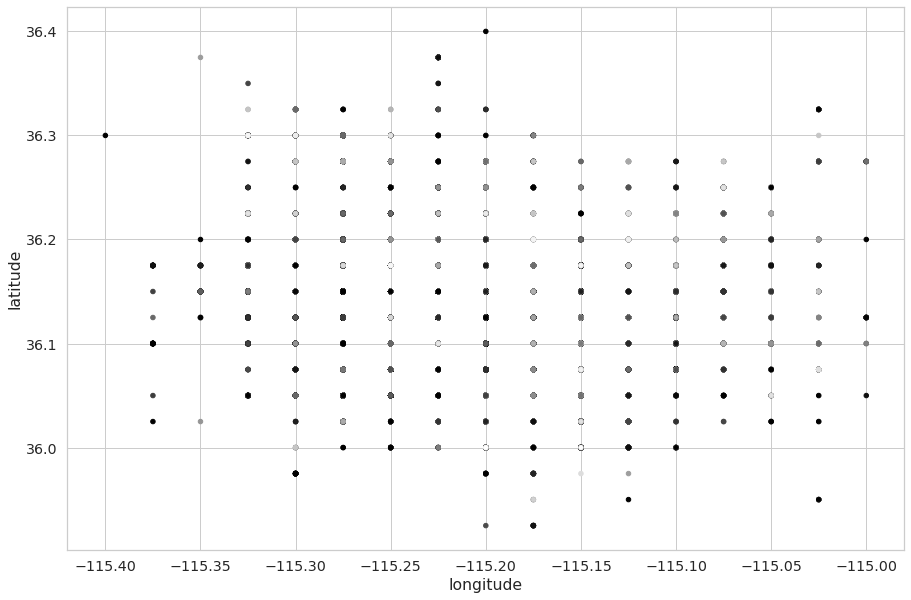

In [66]:
total_table['longitude'] = np.round(total_table['longitude']*4, decimals=1)*0.25 
total_table['latitude'] = np.round(total_table['latitude']*4, decimals=1)*0.25
total_table.plot(x = 'longitude', y = 'latitude', kind = 'scatter',c = array , figsize = [15, 10])
plt.show()

Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

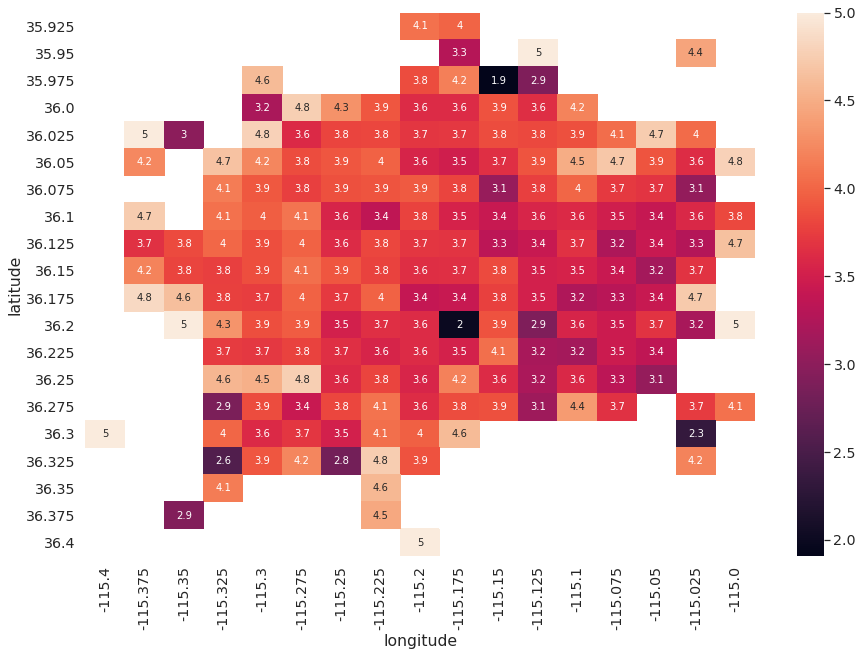

In [67]:
total_table_map = total_table.pivot_table(values = 'average_number_of_stars' ,
                                          index = 'latitude',columns = 'longitude', aggfunc=np.mean)
plt.figure(figsize=(15, 10))
sns.heatmap(total_table_map,  annot = True)
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** Если в районе мало компаний, то в среднем у него может получиться оценка выше, чем у района с большим количеством компаний (даже если в процентом соотношении там меньше высоко оцененных компаний). В выборке наименьшее и наибольшее значение могут сильно отличатьься от всеобще принятых минимальных и максимальных значений в данной области. И тогда чтение(осознание) такого графика будет затруднено для людей.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

In [68]:
now_use_info = total_table.copy()
now_use_info = now_use_info[['latitude', 'longitude', 'name', 'average_number_of_stars']]
now_use_info = now_use_info.groupby(['latitude','longitude', 'average_number_of_stars']).aggregate([np.size])

now_use_info = now_use_info.reset_index('latitude')
now_use_info = now_use_info.reset_index('longitude')
now_use_info = now_use_info.reset_index('average_number_of_stars')

now_use_info = now_use_info.groupby(['latitude','longitude']).aggregate([np.mean, np.size])
now_use_info.columns = now_use_info.columns.droplevel(level = 0)
now_use_info = now_use_info.reset_index('latitude')
now_use_info = now_use_info.reset_index('longitude')
now_use_info.columns = ['longitude', 'latitude','average_number_of_stars', 'size_1','average', 'number of companies']
now_use_info = now_use_info.drop(['size_1', 'average'], axis = 1)
now_use_info = now_use_info.loc[now_use_info['number of companies'] >=30]
now_use_info

,longitude,latitude,average_number_of_stars,number of companies
14,-115.200,36.000,3.496237,85
15,-115.175,36.000,3.552059,46
16,-115.150,36.000,3.659484,62
17,-115.125,36.000,3.459421,140
22,-115.275,36.025,3.445210,64
...,...,...,...,...
163,-115.275,36.275,3.368548,168
164,-115.250,36.275,3.643984,129
166,-115.200,36.275,3.468128,89
176,-115.300,36.300,3.272076,39


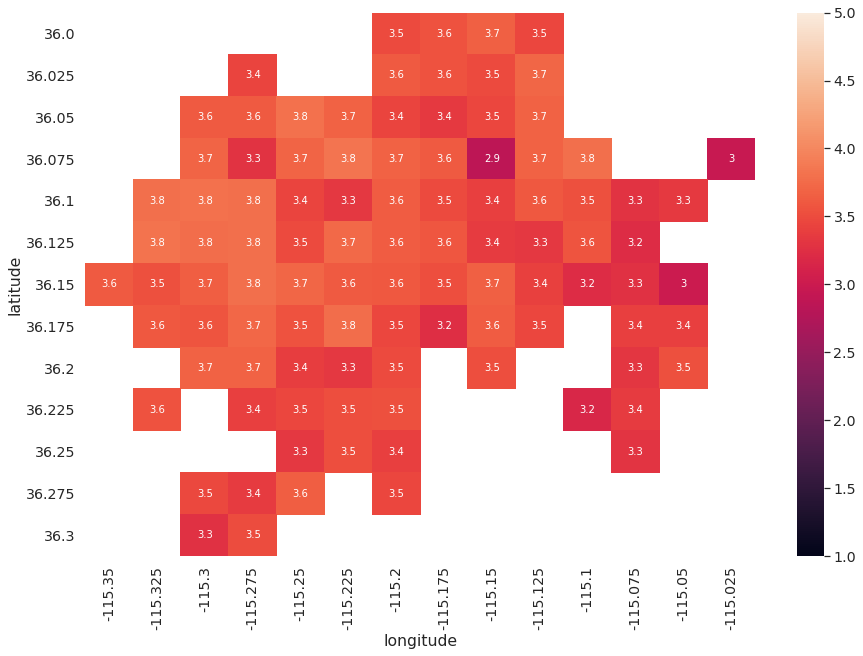

In [69]:
now_use_info_map = now_use_info.pivot_table(values = 'average_number_of_stars' 
                                            ,index = 'latitude',columns = 'longitude', 
                                            aggfunc=np.sum)
plt.figure(figsize=(15, 10))
sns.heatmap(now_use_info_map, vmin=1, vmax=5, annot = True)
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** Видно, что по всем районам более-менее одинаковое распределение оценок, но по этому грпафику легче сравнивать районы между собой и сравнивать с общей 5-балльной системой.

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [70]:
table_with_categories = total_table.copy()
table_with_categories['Is Restaurant'] = table_with_categories["categories"].str.contains("restaurant|Restaurant", case=False, na=False).astype(int)
table_with_categories = table_with_categories.loc[table_with_categories['Is Restaurant'] == 1]
table_with_categories = table_with_categories.drop(['Is Restaurant'],  axis=1)

table_for_cat = table_with_categories.copy()
table_with_categories = table_with_categories.loc[table_with_categories['number_of_reviews'] >=5]
table_with_categories = table_with_categories.drop(['categories', 'number_of_reviews'], axis = 1)
table_with_categories = table_with_categories.groupby(['latitude','longitude', 'average_number_of_stars']).aggregate([np.size])

table_with_categories = table_with_categories.reset_index('average_number_of_stars')
table_with_categories = table_with_categories.reset_index('latitude')
table_with_categories = table_with_categories.reset_index('longitude')

table_with_categories = table_with_categories.groupby(['latitude','longitude']).aggregate([np.mean,np.size])
table_with_categories = table_with_categories.reset_index('latitude')
table_with_categories = table_with_categories.reset_index('longitude')
table_with_categories.columns = table_with_categories.columns.droplevel(0)
table_with_categories.columns = ['longitude', 'latitude', 'average_number_of_stars', 'size_1', 'average', 'number_of_companies']
table_with_categories = table_with_categories.drop(['size_1', 'average'], axis = 1)
table_with_categories = table_with_categories.loc[table_with_categories['number_of_companies'] >=10]
table_with_categories

,longitude,latitude,average_number_of_stars,number_of_companies
5,-115.200,36.000,3.051821,26
6,-115.175,36.000,3.635620,14
7,-115.150,36.000,3.593600,17
8,-115.125,36.000,3.548387,36
10,-115.275,36.025,3.043214,16
...,...,...,...,...
125,-115.050,36.250,2.759358,10
127,-115.275,36.275,3.374231,48
128,-115.250,36.275,3.480259,41
129,-115.200,36.275,3.159261,29


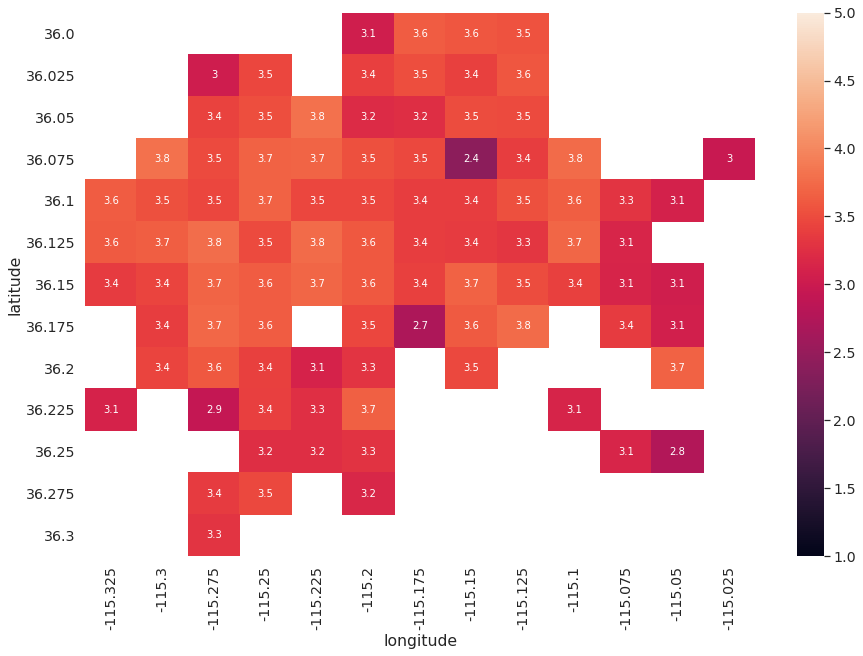

In [71]:
table_with_categories = table_with_categories.pivot_table(values = 'average_number_of_stars' 
                                            ,index = 'latitude',columns = 'longitude', aggfunc=np.sum)
plt.figure(figsize=(15, 10))
sns.heatmap(table_with_categories, vmin=1, vmax=5, annot = True)
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** Количество ресторанов в районе делает анализ более честным(примерно как весовые группы в  соревнованиях по борьбе), тогда мы можем судить об оценках примерно всех ресторанов данного района. Аналогично и с отзывами, чем больше данных, тем меньше может быть среднее, так как тем больше разброс. Если он для всех примерно одинаковый, то и выборка более достоверная.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [72]:
table_for_cat = table_for_cat.loc[table_for_cat['number_of_reviews'] >=50]
table_for_cat = table_for_cat.sort_values('average_number_of_stars', ascending = False)
table_for_cat.head(10)

,latitude,longitude,categories,name,average_number_of_stars,number_of_reviews
3599,36.125,-115.175,Food Tours;Restaurants;Event Planning & Servic...,"""Lip Smacking Foodie Tours""",4.966480,179
25397,36.150,-115.150,Restaurants;Burgers;Food Stands;Sandwiches;Hot...,"""Pepito Shack""",4.907692,65
16612,36.125,-115.175,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...,"""Bosa Boba Cafe""",4.890909,55
25720,36.175,-115.275,Tacos;Street Vendors;Farmers Market;Vegetarian...,"""Garden Grill""",4.868132,91
2127,36.050,-115.250,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...,"""Brew Tea Bar""",4.848069,1165
18949,36.125,-115.100,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...,"""Poppa Naps BBQ""",4.836538,104
12014,36.100,-115.100,Restaurants;Breakfast & Brunch;Cafes,"""Zenaida's Cafe""",4.833333,180
11918,36.100,-115.150,Caterers;Mexican;Restaurants;Food;Event Planni...,"""El Frescos Cocina Mexicana""",4.816754,191
5339,36.150,-115.225,Adult Entertainment;Lounges;Hookah Bars;Restau...,"""Blaqcat Ultra Hookah Lounge""",4.809524,63
25287,36.175,-115.150,Juice Bars & Smoothies;Restaurants;Sandwiches;...,"""Smooth Eats""",4.807018,57


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [73]:
table_for_cat = table_for_cat.loc[table_for_cat['average_number_of_stars'] >=4.7]
table_for_cat.loc[:, ('drow_color')] = 'silver'
table_for_cat.iloc[0:9, 6] = 'gold'
table_for_cat

,latitude,longitude,categories,name,average_number_of_stars,number_of_reviews,drow_color
3599,36.125,-115.175,Food Tours;Restaurants;Event Planning & Servic...,"""Lip Smacking Foodie Tours""",4.966480,179,gold
25397,36.150,-115.150,Restaurants;Burgers;Food Stands;Sandwiches;Hot...,"""Pepito Shack""",4.907692,65,gold
16612,36.125,-115.175,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...,"""Bosa Boba Cafe""",4.890909,55,gold
25720,36.175,-115.275,Tacos;Street Vendors;Farmers Market;Vegetarian...,"""Garden Grill""",4.868132,91,gold
2127,36.050,-115.250,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...,"""Brew Tea Bar""",4.848069,1165,gold
18949,36.125,-115.100,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...,"""Poppa Naps BBQ""",4.836538,104,gold
12014,36.100,-115.100,Restaurants;Breakfast & Brunch;Cafes,"""Zenaida's Cafe""",4.833333,180,gold
11918,36.100,-115.150,Caterers;Mexican;Restaurants;Food;Event Planni...,"""El Frescos Cocina Mexicana""",4.816754,191,gold
5339,36.150,-115.225,Adult Entertainment;Lounges;Hookah Bars;Restau...,"""Blaqcat Ultra Hookah Lounge""",4.809524,63,gold
25287,36.175,-115.150,Juice Bars & Smoothies;Restaurants;Sandwiches;...,"""Smooth Eats""",4.807018,57,silver


In [74]:
fig = px.scatter_mapbox(table_for_cat, lat="latitude", lon="longitude", color = 'drow_color',hover_name="name",zoom = 10, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** кот Василий ,определенно, гурман, но это не важно. Больше всего компаний в Лас-Вегасе. Самые лучшие рестораны, как мы видим, находятся на юго-западе Лас-Вегаса. Местоположение компаний достаточно точно обрисовывает карту города(логично, что город делится по улицам, а на улицах в основном находятся компании). И важно отметить, что сравнивать средние параметры оценок надо только в близких по категориям объектах.